In [13]:
import numpy as np 
import torch
from torchsummary import summary
import torch.optim as optim
import matplotlib.pyplot as plt
import pandas as pd
import torch; torch.manual_seed(0)
import torch.nn as nn
import torch.nn.functional as F
import torch.utils
import matplotlib.pyplot as plt; plt.rcParams['figure.dpi'] = 200

In [41]:
device = 'cpu'
gen_dir = 'generated_data/'
models_dir = 'models/'


In [443]:
def get_index(train_batches,shuffle_batches=True, seed=42):
    if shuffle_batches:
        np.random.seed(seed)
        indexes = np.random.randint(0, train_batches, train_batches)
        return iter(indexes)
    else:
        return iter(range(train_batches))
def get_batch(data, index, shuffle_stocks=True, extra_dim=False):
    batch = data[index, :, :].copy()
    batch = np.transpose(batch)
    if shuffle_stocks:
        batch = batch[:, np.random.permutation(batch.shape[1])]
    if extra_dim:
        batch = np.expand_dims(batch, axis=1)
    return batch

class VAE_Base(nn.Module):
    def __init__(self, latent_dims):
        super(VAE_Base, self).__init__()
        self.latent_dims = latent_dims
        
    def reparameterize(self, mu, logvar):
        sigma = torch.exp(logvar)
        N = torch.distributions.Normal(0,1)
        # return torch.normal(mu, std)
        # esp = torch.randn(*mu.size())
        z = mu + sigma*N.sample(mu.shape)
        self.kl = (sigma**2 + mu**2 - torch.log(sigma) - 1/2).sum()
        return z
    
    def bottleneck(self, h):
        mu, logvar = self.fc1(h), self.fc2(h)
        z = self.reparameterize( mu, logvar)
        return z, mu, logvar

    def encode(self, x):
        h = self.encoder(x)
        z, mu, logvar = self.bottleneck(h)
        return z, mu, logvar

    def decode(self, z):
        z = self.decoder(z)
        return z

    def forward(self, x):
        z, mu, logvar = self.encode(x)
        z = self.decode(z)
        return z, mu, logvar 

def plot_training(losses):
    fig, axes = plt.subplots(1,len(losses), sharex=False, sharey=False)
    for i , (key, value) in enumerate(losses.items()):
        x_points = range(0, len(value))
        axes[i].set_title(key, fontsize=10)
        axes[i].plot(x_points, value, color="blue", linewidth=5)
        axes[i].yaxis.grid(True, zorder=0)
        axes[i].set_xlabel('Iteration', fontsize=10)
        # axes[i].legend(loc='upper right')
    # plt.tight_layout()
    plt.show()

def train_vae(vae, data, epochs=20, shuffle_stocks=True,shuffle_batches=True,extra_dim=False,learning_rate=0.0001, lambda_rec=0.7, lambda_reg=0.3 ):
    train_batches = data.shape[0] # N hereafter. Number of training images in database.
    opt = torch.optim.Adam(vae.parameters(), lr=learning_rate)
    loss_total_to_plot = []
    loss_recon_to_plot = []
    loss_reg_to_plot = []
    
    for epoch in range(epochs):
        vae.train()
        indexes = get_index(train_batches,shuffle_batches)
        loss_total = 0
        loss_recon_total = 0
        loss_reg_total = 0
        for i in range(train_batches):
            index = next(indexes)
            batch= get_batch(data.copy(), index, shuffle_stocks=shuffle_stocks ,extra_dim=extra_dim)
            x = torch.from_numpy(batch) # GPU
            # print(x.shape)
            opt.zero_grad()
            x_hat, mu, logvar = vae(x)
            loss_recon = ((x - x_hat)**2).sum()
            reg_loss = vae.kl
            loss = lambda_rec*loss_recon + lambda_reg*reg_loss
            # loss = 0.7*((x - x_hat)**2).sum() + 0.3*vautoencoder.encoder.kl
            loss.backward()
            opt.step()
            loss_total += loss.item()
            loss_recon_total += loss_recon.item()
            loss_reg_total += reg_loss.item()

        loss_total_to_plot.append(loss_total/train_batches)
        loss_recon_to_plot.append(loss_recon_total/train_batches)
        loss_reg_to_plot.append(loss_reg_total/train_batches)
        print('Epoch %s/%s, Loss=%s, Recon=%s, Reg=%s ' % (epoch+1, epochs, loss_total/train_batches, loss_recon_total/train_batches, loss_reg_total/train_batches))
    losses={'Total Loss': loss_total_to_plot, 
            'Reconstruction loss': loss_recon_to_plot, 
            'Regularization loss':loss_reg_to_plot}
    plot_training(losses)

    return vae


def plot_reconstruction(batch_idx, series_idx, model, data, extra_dim=False):
    batch= data[batch_idx]
    batch= np.transpose(batch)
    x = torch.from_numpy(batch)
    model.eval()
    if extra_dim:
        x = x.view( x.size(0), 1, x.size(1))
    # print(x.shape)
    x_hat, _, _, = model(x.to(device))
    # x_hat = vae.decoder(z)
    # x_hat = x_hat.numpy()
    x_hat = x_hat.to('cpu').detach().numpy()
    # print(x_hat.shape)
    if extra_dim:
        x_hat = np.squeeze(x_hat, 1)
    # print(x_hat.shape)

    fig, axes = plt.subplots(3,1, figsize=(30,20), dpi= 50)
    axes[0].plot(batch[series_idx, :], label='original')
    axes[0].plot(x_hat[series_idx, :], label='reconstructed')
    axes[0].legend()
    axes[1].plot(x_hat[series_idx, :], label='reconstructed', color='darkorange')
    axes[1].legend()
    axes[2].plot(batch[series_idx, :], label='original')
    axes[2].legend()
    plt.show()
    return x_hat 

def vae_generation(decoder,latent_dims, extra_dim=False):
    # enc_dec_net: Network with encoder and decoder, pretrained.
    # n_samples: how many samples to produce.
    
    # Create samples of z from Gaussian N(0,I), where means are 0 and standard deviations are 1 in all dimensions.
    z_samples = np.random.normal(loc=0.0, scale=1.0, size=latent_dims)
    z_samples_t = torch.tensor(z_samples, dtype=torch.float64)
    # print(z_samples_t.shape)
    x_samples = decoder(z_samples_t)
    # print(x_samples.shape)
    
    x_samples_np = x_samples if type(x_samples) is np.ndarray else x_samples.detach().numpy()  # torch to numpy
    if extra_dim:
        # print('a')
        x_samples_np = np.squeeze(x_samples_np, 1)

    return x_samples_np  


class Flatten(nn.Module):
    def forward(self, input):
        return input.view(input.size(0), -1)
    
class UnFlatten(nn.Module):
    def forward(self, input):
        return input.view(input.size(0), 1, input.size(1))

class PrintLayer(nn.Module):
    def __init__(self, name=None):
        super(PrintLayer, self).__init__()
        self.name = name
    
    def forward(self, x):
        # Do your print / debug stuff here
        print(self.name)
        # print(x)
        print(x.shape)
        return x 
        
def plot_series(batch, idxs:list, label, title=None, figsize=(15, 5), merge=False):
    # fig, ax = plt.subplots(1, len(idxs), figsize=figsize)
    for i, idx in enumerate(idxs):
        plt.plot(batch[idx], label=label+str(i))
        plt.legend()
        if title:
            plt.suptitle(title)
        plt.show()
    if merge:
        fig, ax = plt.subplots(1, 1, figsize=figsize)
        for i, idx in enumerate(idxs):
            ax.plot(batch[idx], label=label+str(i))
            ax.legend()
        if title:
            fig.suptitle(title)
            plt.show()

In [389]:
# Load data
data = np.load('master_data/data.npy')
train_batches = data.shape[0] # N hereafter. Number of training images in database.
length = data.shape[1] 
stocks = data.shape[2]
print('Number of training batches: ', train_batches)
print('Length of each batch: ', length)
print('Number of stocks: ', stocks)

Number of training batches:  79
Length of each batch:  256
Number of stocks:  434


## VAE Fully Dense 

    # Encoder 
    input
    torch.Size([434, 256])
    linear
    torch.Size([434, 128])

    # Latent space
    torch.Size([434, 20])
    
    # Decoder
    decoder input
    torch.Size([434, 128])
    linear
    torch.Size([434, 256])

In [390]:
class VAE_Dense(VAE_Base):
    def __init__(self, **kwargs ):
        super(VAE_Dense, self).__init__(**kwargs )
        self.encoder = nn.Sequential(
            nn.Linear(256, 128).double(),
            nn.ReLU()
        )
          
        self.fc1 = nn.Linear(128, self.latent_dims).double()
        self.fc2 = nn.Linear(128, self.latent_dims).double()
        
        self.decoder = nn.Sequential(
            nn.Linear(self.latent_dims, 128).double(),
            nn.ReLU(),
            nn.Linear(128, 256).double()
        )
        


In [317]:
latent_dims = 20
vae = VAE_Dense(latent_dims=latent_dims).to(device)

Epoch 1/60, Loss=4626.462085412021, Recon=4786.362135122994, Reg=4386.612010845561 
Epoch 2/60, Loss=3152.528428487646, Recon=2479.2705185749314, Reg=4162.415293356716 
Epoch 3/60, Loss=2518.1826125118173, Recon=1584.8308513569839, Reg=3918.2102542440693 
Epoch 4/60, Loss=2112.841185918901, Recon=1088.95871879833, Reg=3648.664886599757 
Epoch 5/60, Loss=1826.13428736712, Recon=780.5526859433663, Reg=3394.50668950275 
Epoch 6/60, Loss=1632.6902278268958, Recon=585.1368343285433, Reg=3204.020318074427 
Epoch 7/60, Loss=1511.1256908843695, Recon=457.78122035434575, Reg=3091.142396679406 
Epoch 8/60, Loss=1440.7433566755203, Recon=374.5868554522697, Reg=3039.978108510396 
Epoch 9/60, Loss=1400.6826014080439, Recon=318.2536437354486, Reg=3024.326037916936 
Epoch 10/60, Loss=1376.7610357604492, Recon=279.74739006244505, Reg=3022.281504307455 
Epoch 11/60, Loss=1360.9527337810284, Recon=253.35015423553068, Reg=3022.3566030992743 
Epoch 12/60, Loss=1349.0833831695788, Recon=234.0524734793708, 

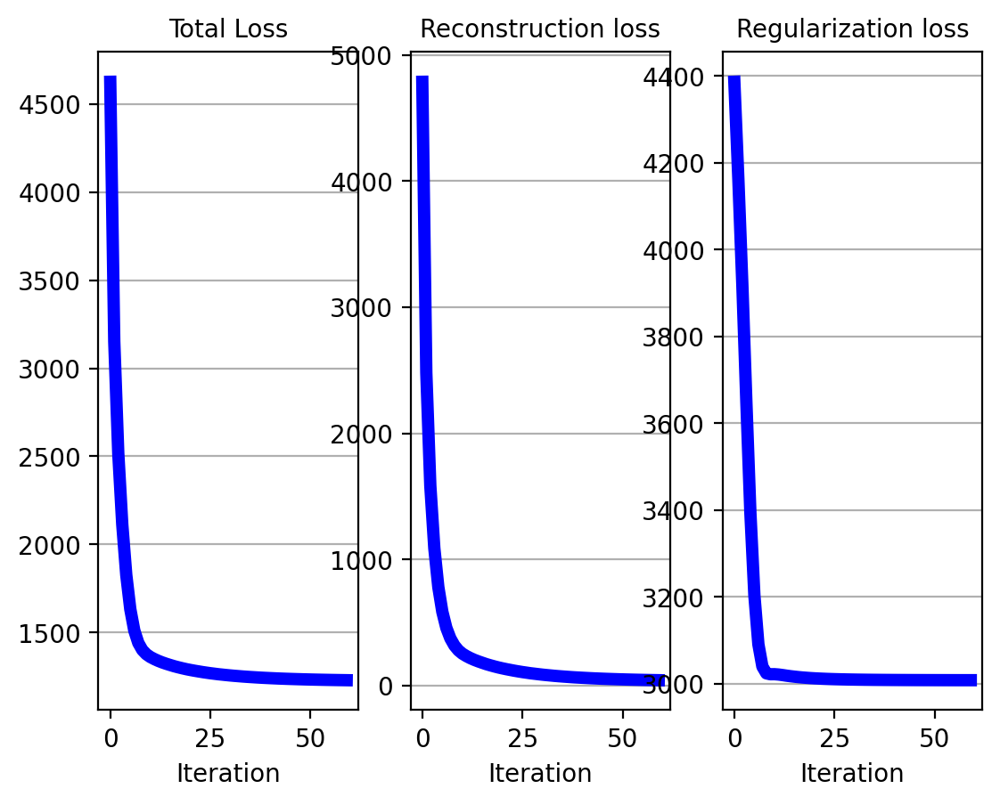

In [318]:
vae = train_vae(vae, data.copy(), 60, learning_rate=0.0001, lambda_rec=0.6, lambda_reg=0.4)

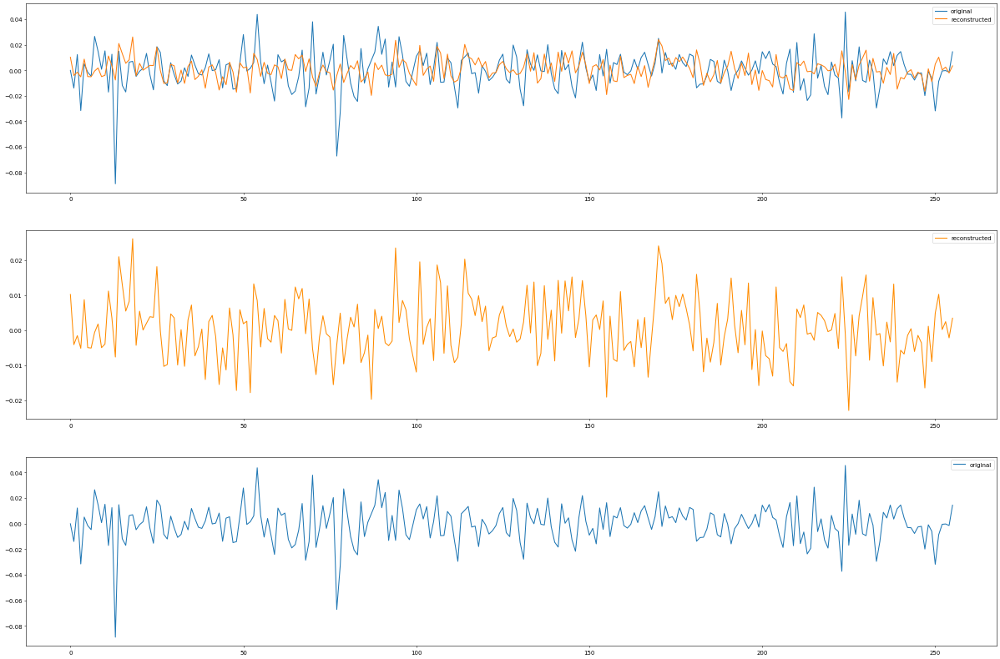

In [391]:
batch_idx = 0
series_idx = 2
x_hat=plot_reconstruction(batch_idx, series_idx, vae, data, extra_dim=False)

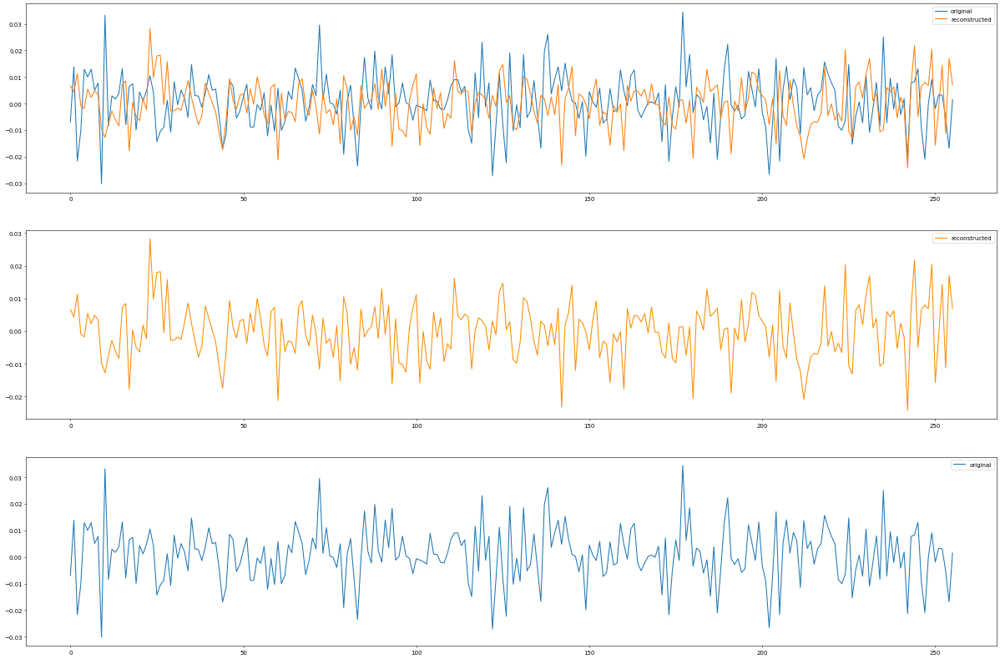

In [392]:
batch_idx = 40
series_idx = 2
x_hat=plot_reconstruction(batch_idx, series_idx, vae, data, extra_dim=False)

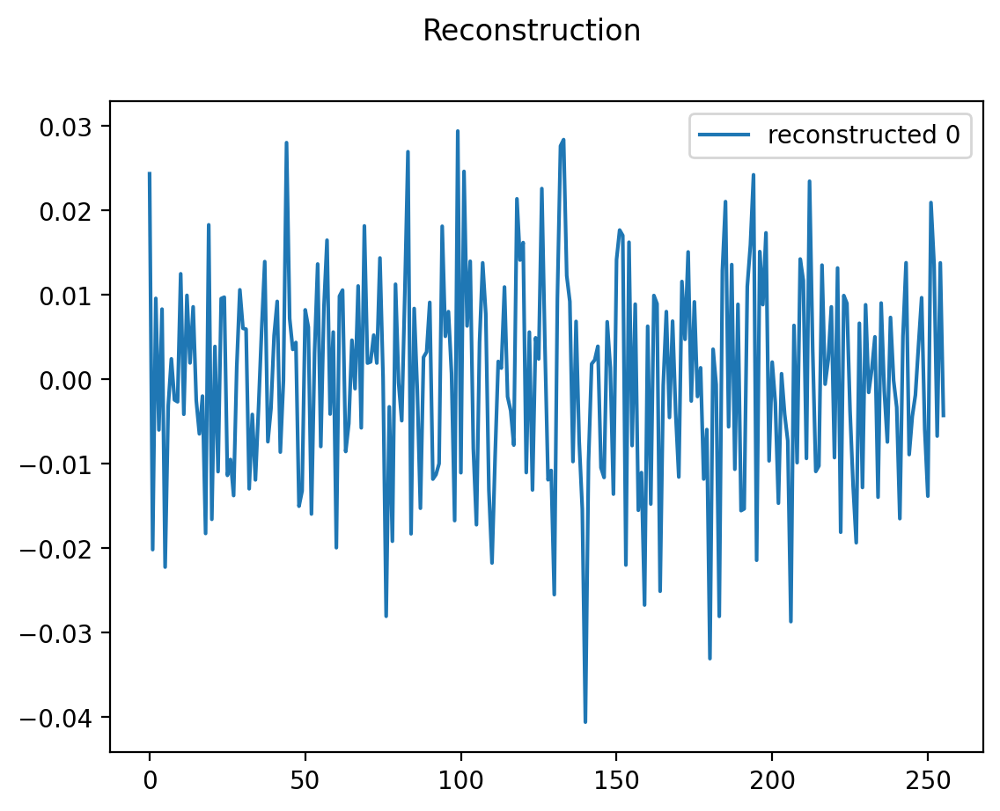

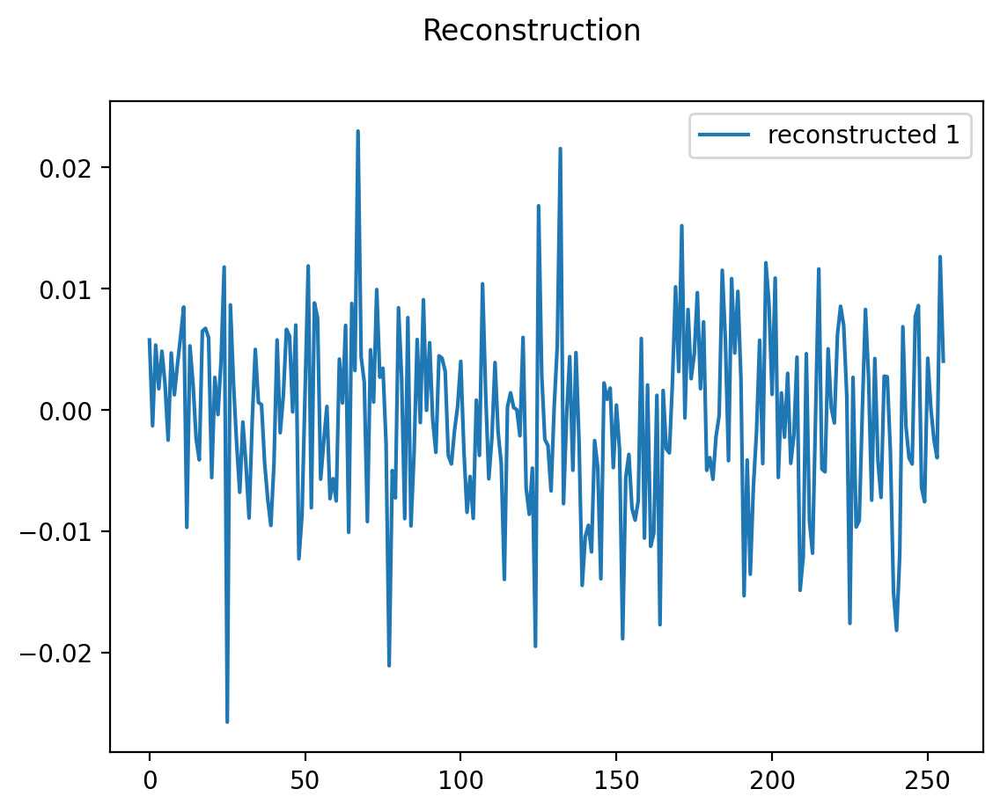

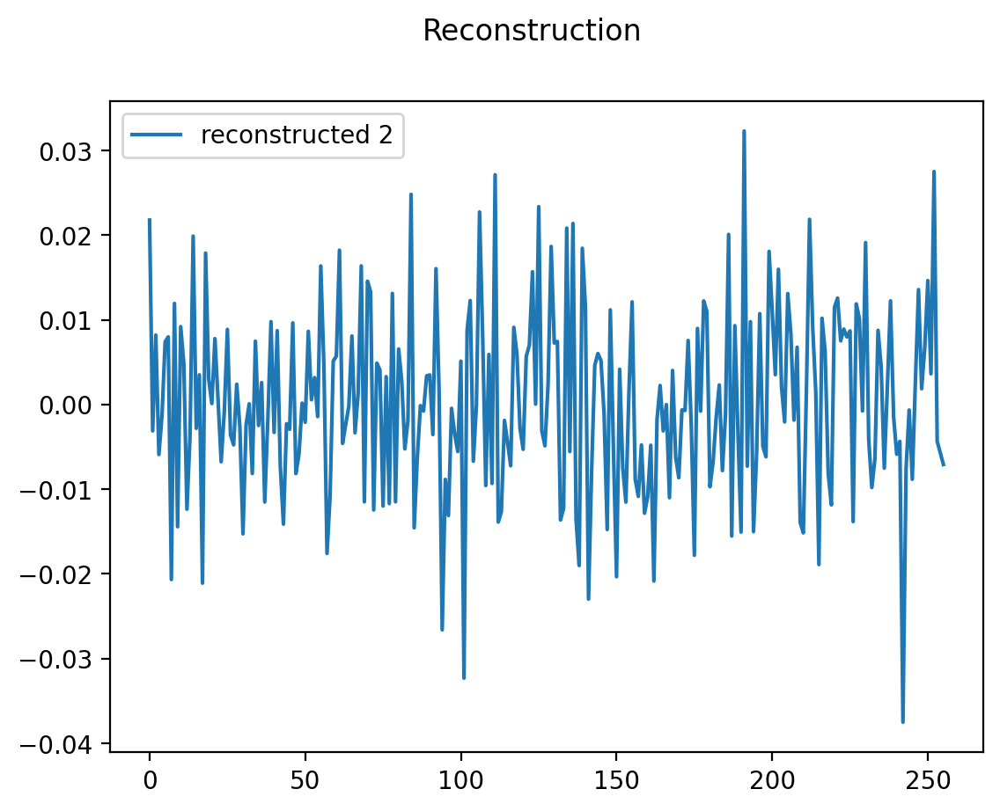

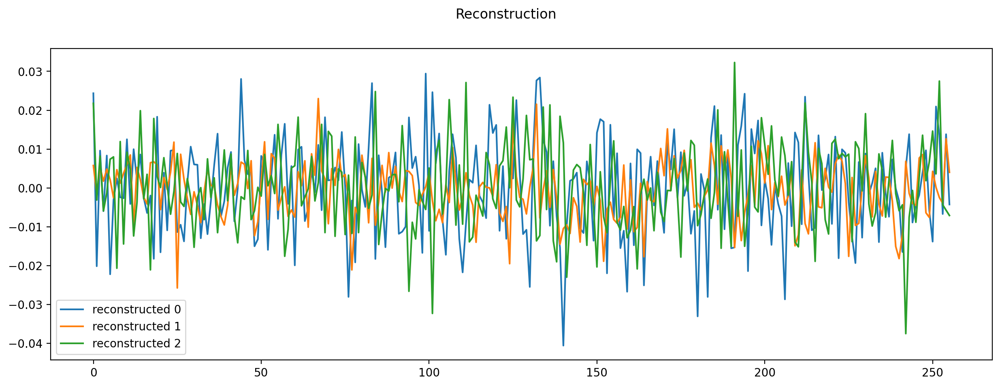

In [378]:
idxs = [20,50,110]
plot_series(x_hat, idxs, label = 'reconstructed ', title='Reconstruction', figsize=(15, 5), merge=True)


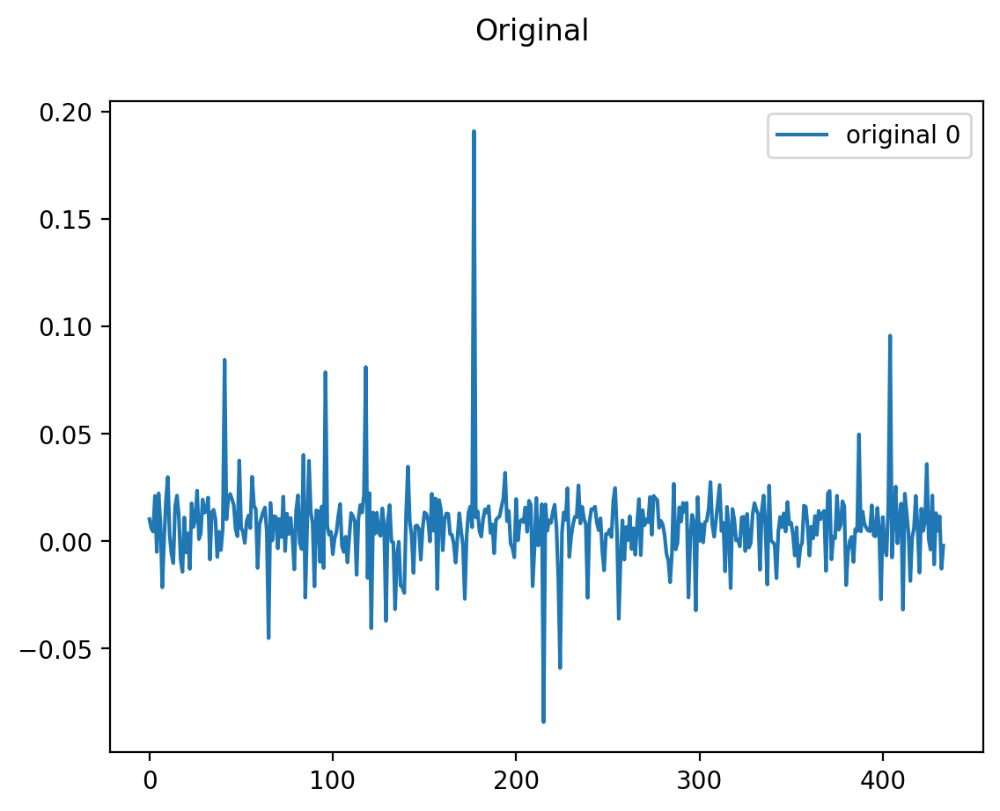

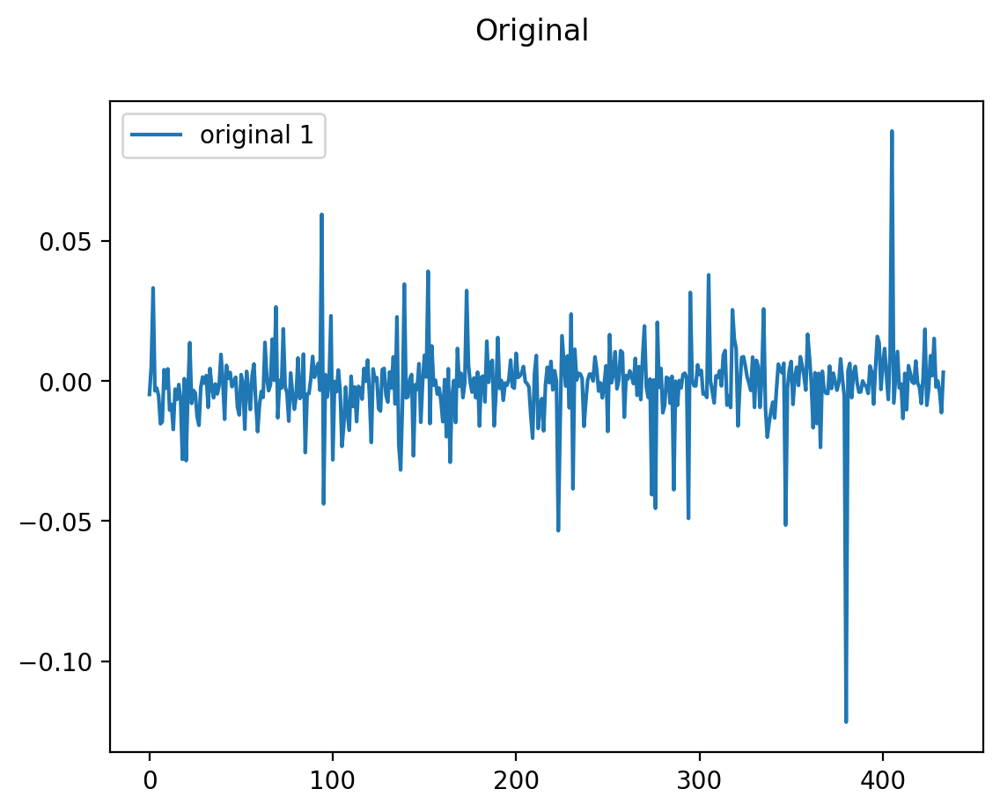

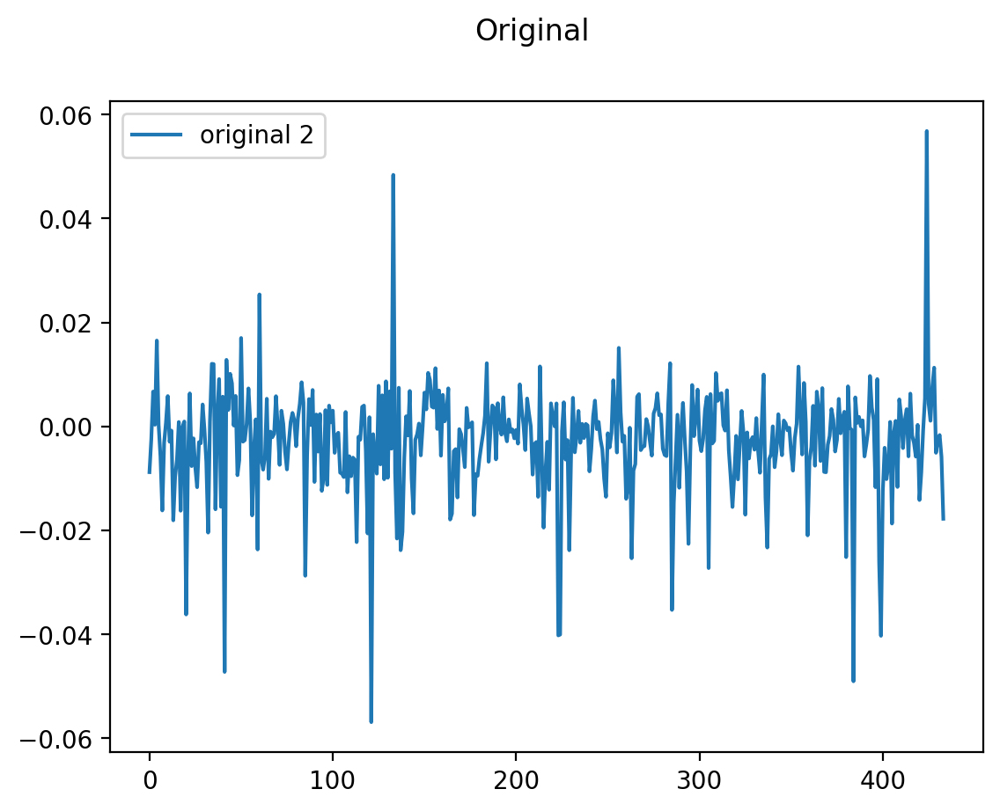

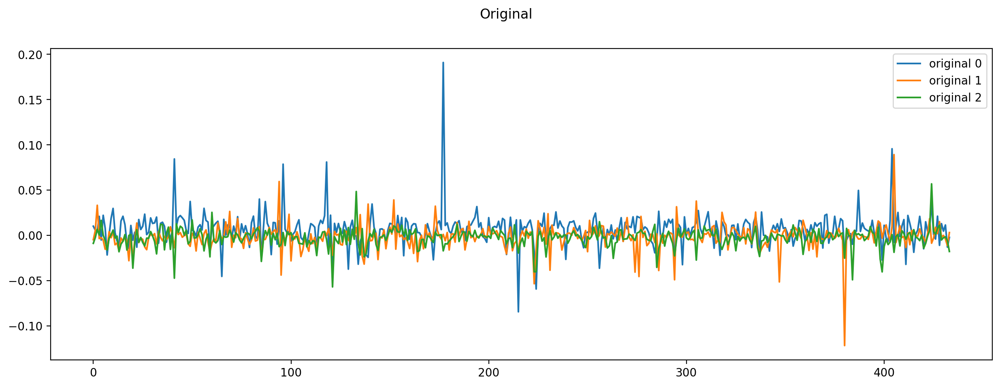

In [322]:
plot_series(data[batch_idx], idxs, label = 'original ', title='Original', figsize=(15, 5), merge=True)

In [444]:
# latent_dims = [stocks, 10]
latent_dims = 20
generation = vae_generation(vae.decoder, latent_dims=[stocks, latent_dims])
generation.shape
# out

(434, 256)

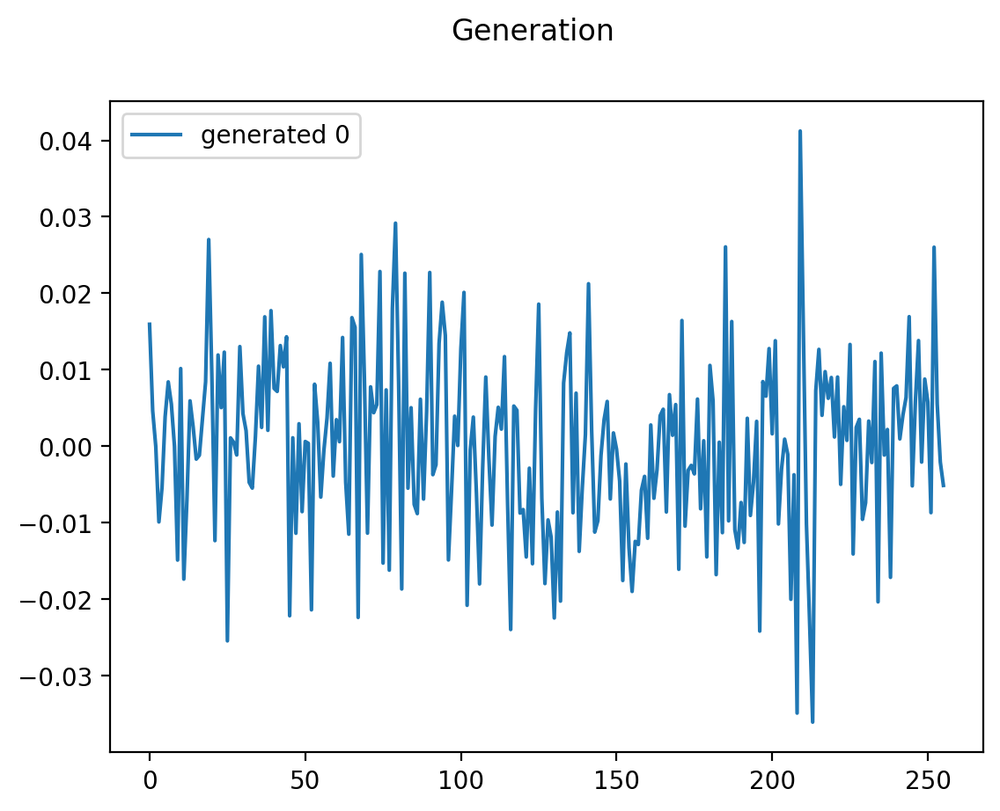

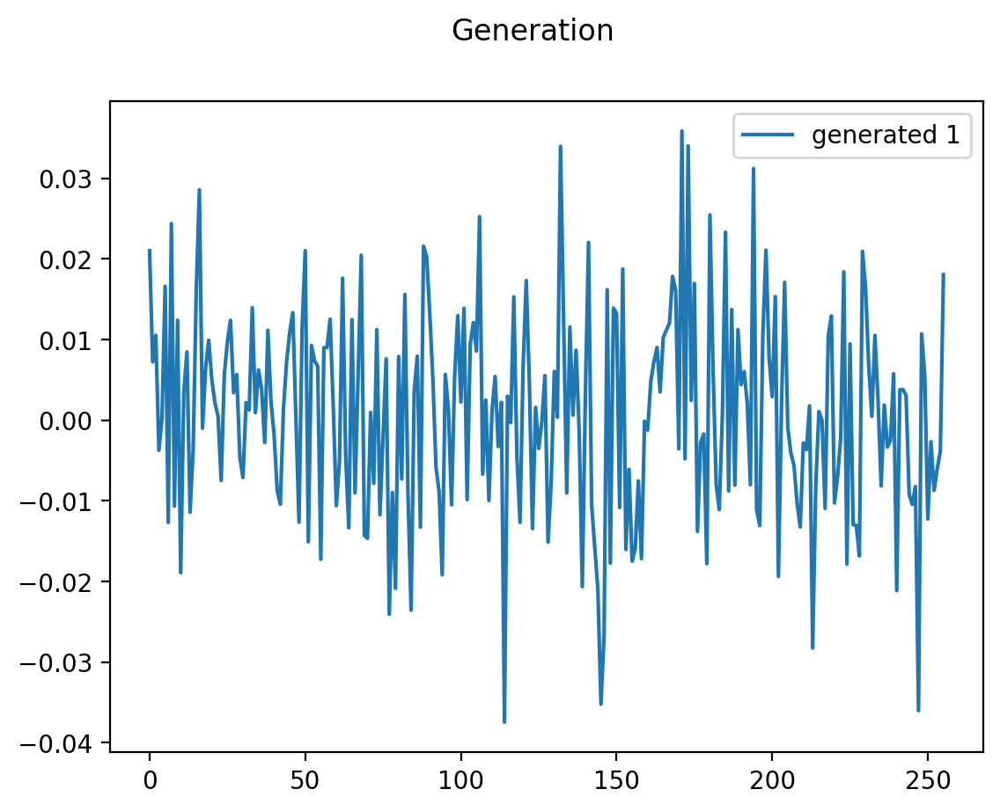

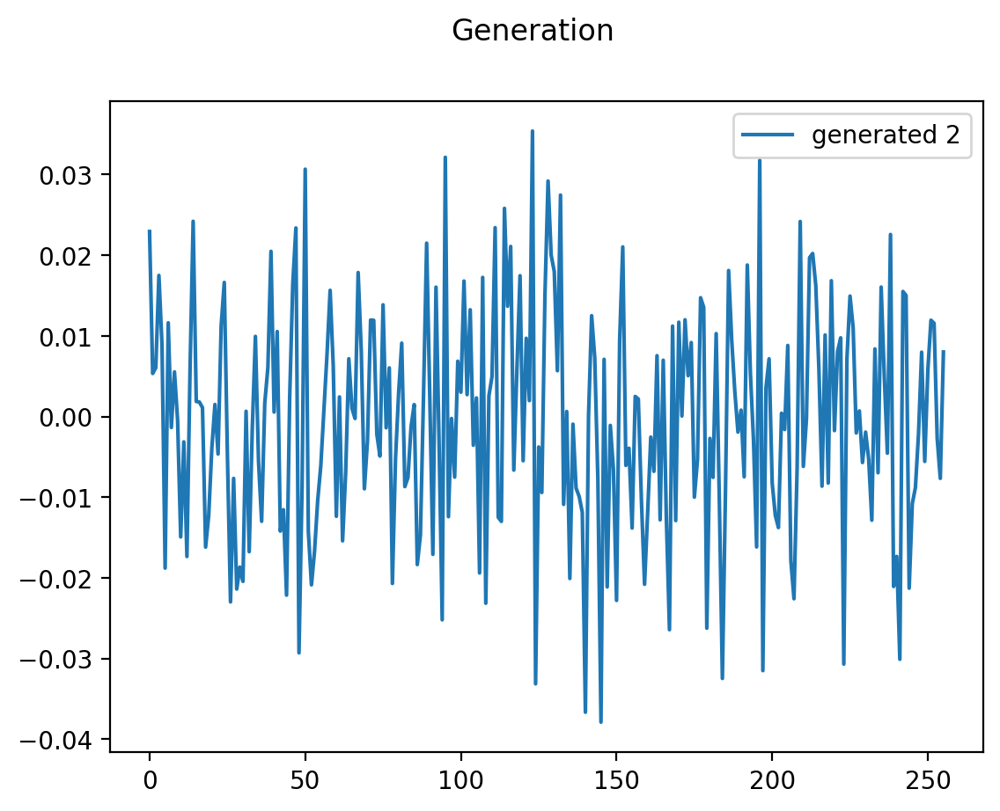

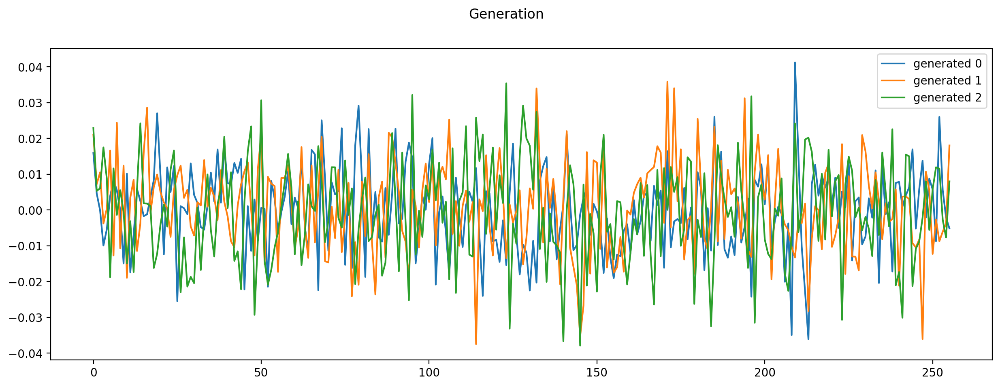

In [445]:
idx = [1, 2, 3]
plot_series(generation, idxs, label = 'generated ', title='Generation', figsize=(15, 5), merge=True)


In [324]:
np.save(gen_dir+'vaefd1.npy',generation)
torch.save(vae.state_dict(), models_dir +"vaefd1.pth") 

## VAE Fully Dense paper

In [325]:
class VAE_Dense1(VAE_Base):
    def __init__(self, **kwargs ):
        super(VAE_Dense1, self).__init__(**kwargs )
        self.encoder = nn.Sequential(
            nn.Linear(256, 80).double(),
            nn.ReLU(),
            nn.Linear(80, 40).double(),
            nn.ReLU(),
            nn.Linear(40, 20).double(),
            nn.ReLU(),
        )
          
        self.fc1 = nn.Linear(20, self.latent_dims).double()
        self.fc2 = nn.Linear(20, self.latent_dims).double()
        
        self.decoder = nn.Sequential(
            nn.Linear(self.latent_dims, 20).double(),
            nn.ReLU(),
            nn.Linear(20, 40).double(),
            nn.ReLU(),
            nn.Linear(40, 80).double(),
            nn.ReLU(),
            nn.Linear(80, 256).double(),
        )

In [326]:
latent_dims = 10
vae1 = VAE_Dense1(latent_dims=latent_dims).to(device)

Epoch 1/15, Loss=1199.4639302248027, Recon=286.7499439701823, Reg=2112.1779164794234 
Epoch 2/15, Loss=836.5242855568462, Recon=52.91482907952233, Reg=1620.13374203417 
Epoch 3/15, Loss=774.6259016741996, Recon=42.1157624599446, Reg=1507.1360408884548 
Epoch 4/15, Loss=771.7758931170163, Recon=39.23597505111076, Reg=1504.3158111829218 
Epoch 5/15, Loss=771.0132077283084, Recon=37.78433367858165, Reg=1504.2420817780353 
Epoch 6/15, Loss=770.5424882992132, Recon=36.883427676266194, Reg=1504.2015489221603 
Epoch 7/15, Loss=770.2354304060474, Recon=36.29452568788268, Reg=1504.1763351242125 
Epoch 8/15, Loss=770.0046809444746, Recon=35.849327083357764, Reg=1504.160034805592 
Epoch 9/15, Loss=769.8452177120379, Recon=35.54099484992171, Reg=1504.1494405741544 
Epoch 10/15, Loss=769.7244875456784, Recon=35.30707550916504, Reg=1504.1418995821923 
Epoch 11/15, Loss=769.6354747947628, Recon=35.13390978572281, Reg=1504.1370398038018 
Epoch 12/15, Loss=769.5638191165847, Recon=34.99263544839532, Re

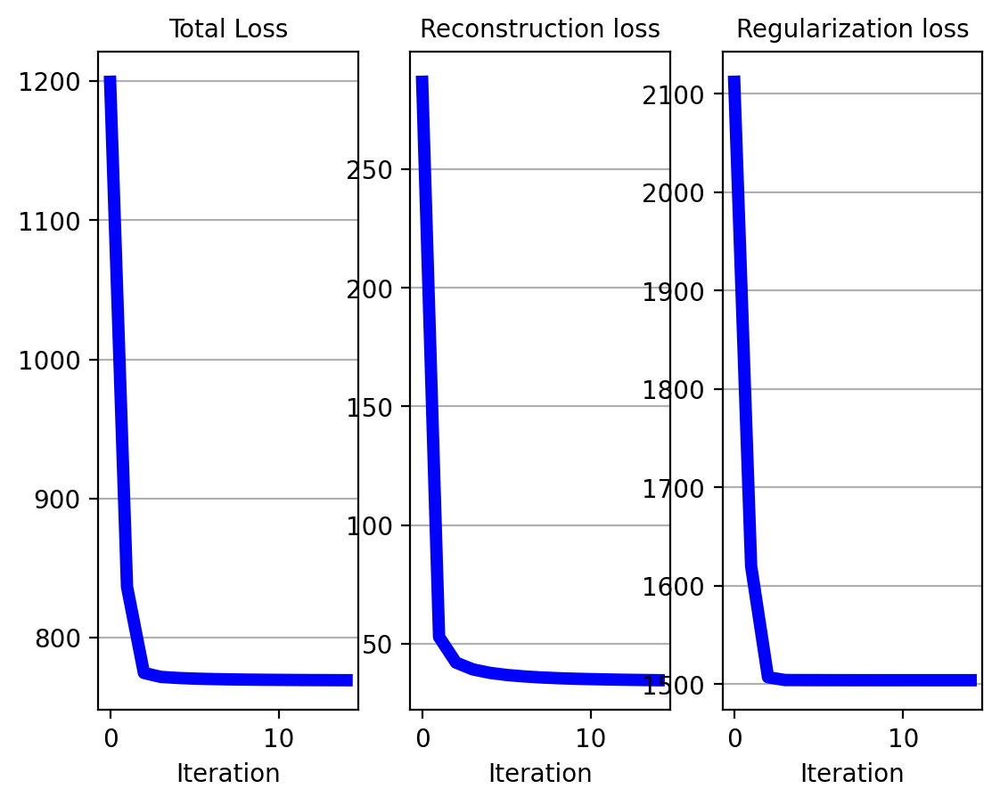

In [327]:
vae1 = train_vae(vae1, data.copy(), 15, learning_rate=0.0004, lambda_rec=0.5, lambda_reg=0.5)

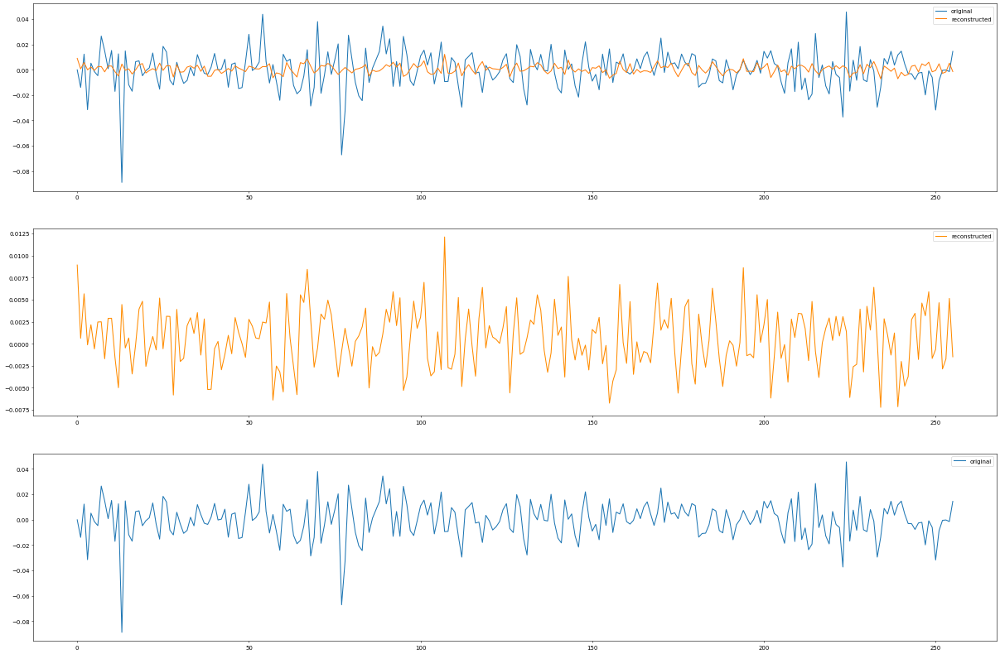

In [393]:
batch_idx = 0
series_idx = 2
x_hat=plot_reconstruction(batch_idx, series_idx, vae1, data.copy(), extra_dim=False)

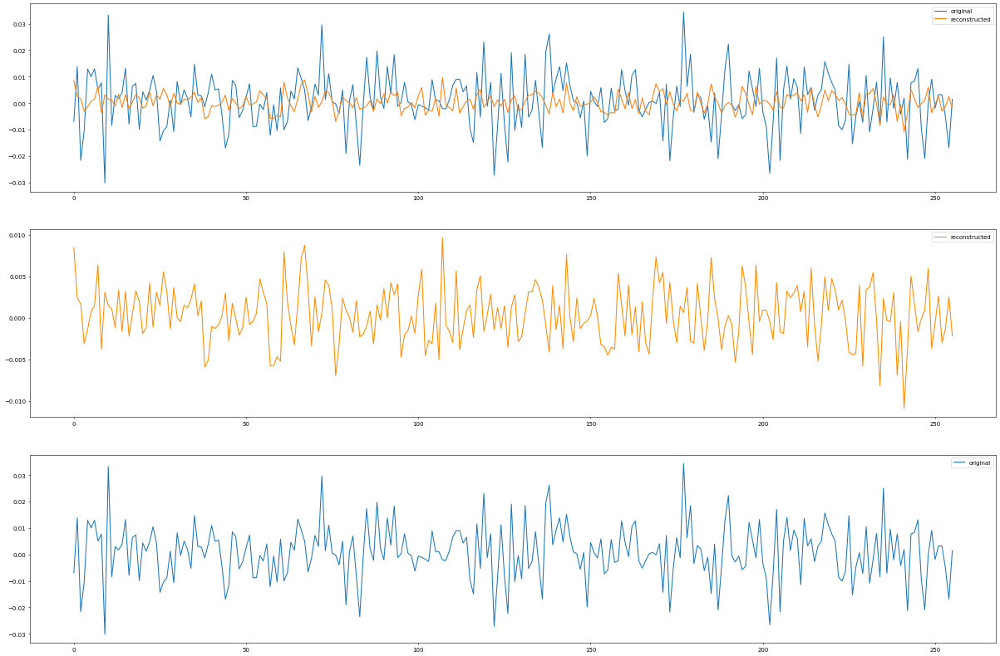

In [394]:
batch_idx = 40
series_idx = 2
x_hat=plot_reconstruction(batch_idx, series_idx, vae1, data.copy(), extra_dim=False)

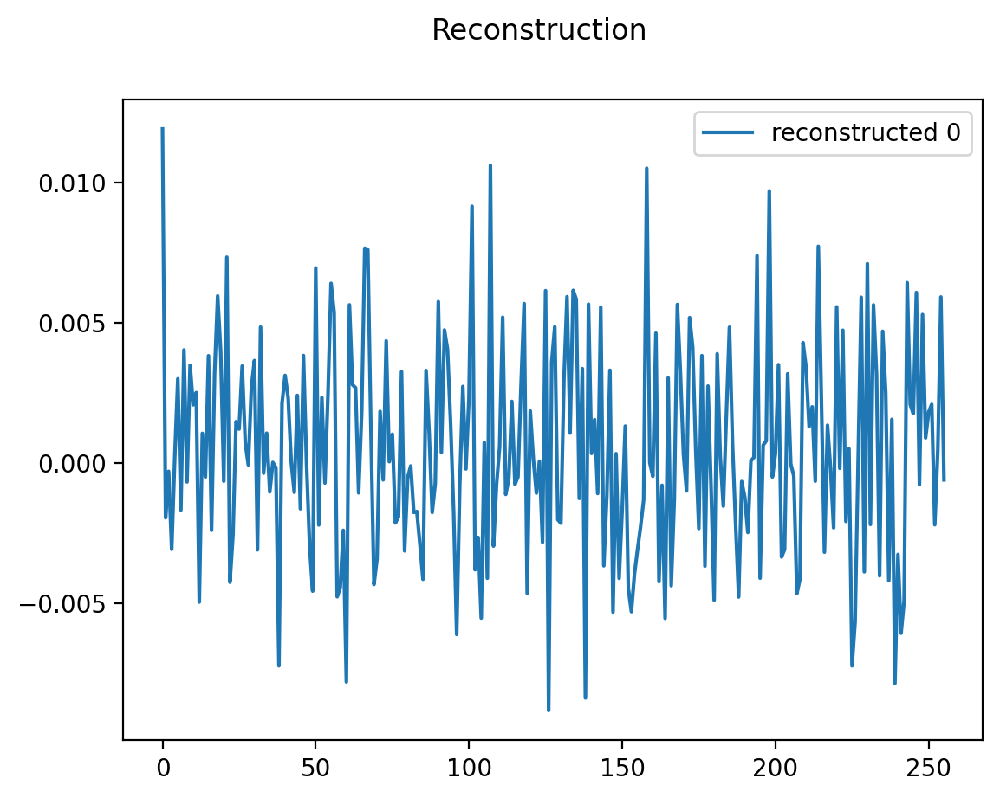

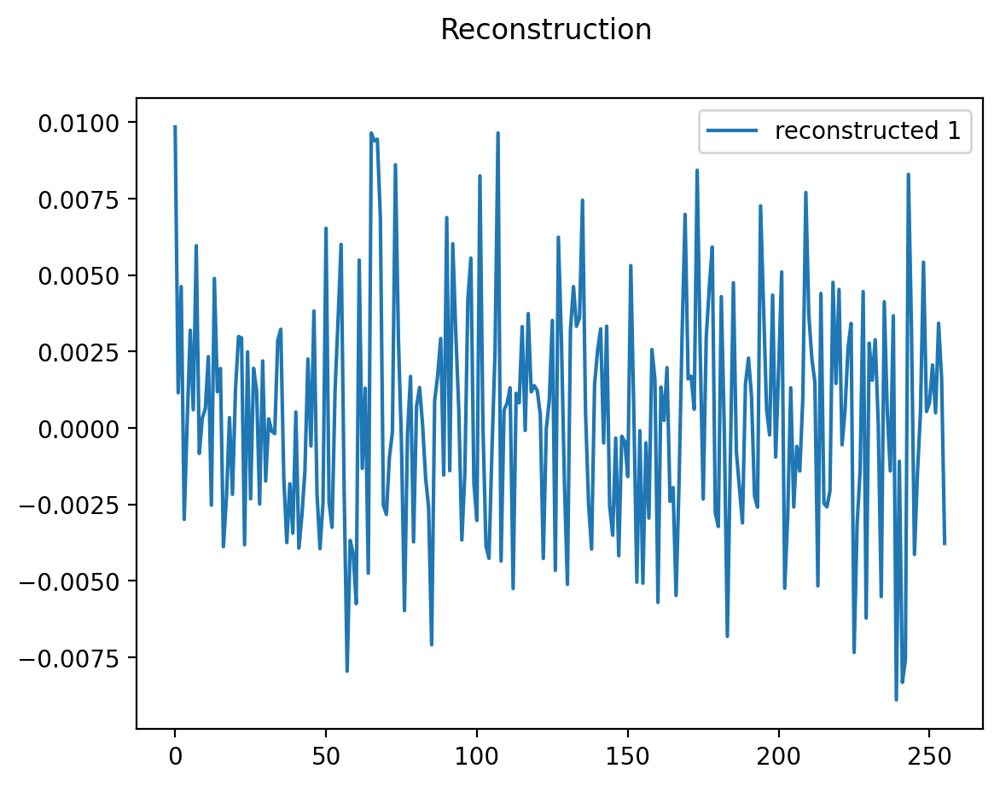

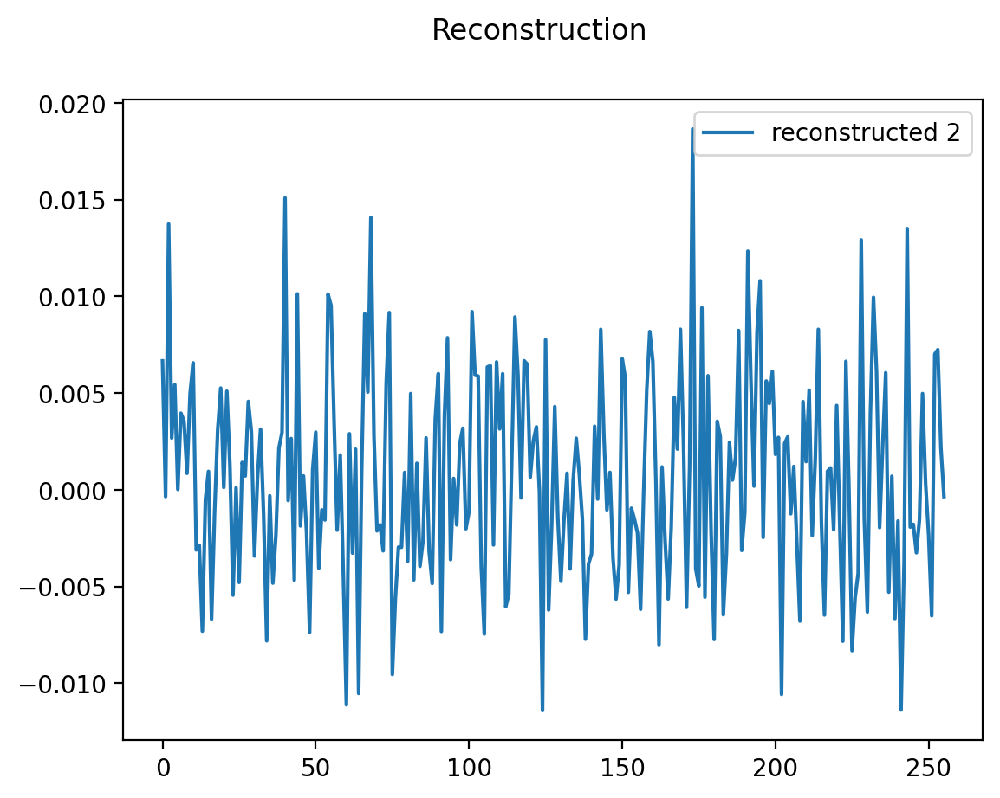

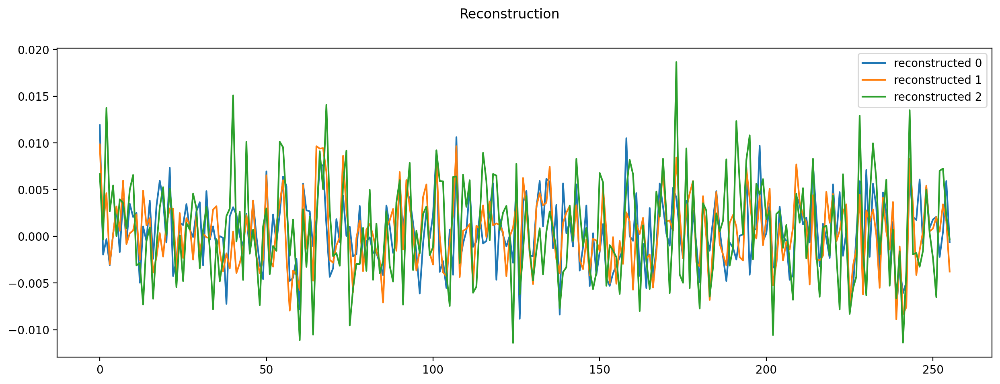

In [380]:
idxs = [20,50,110]
plot_series(x_hat, idxs, label = 'reconstructed ', title='Reconstruction', figsize=(15, 5), merge=True)

In [446]:
latent_dims = 10
# latent_dims = [stocks, 10]
generation = vae_generation(vae1.decoder, latent_dims=[stocks, latent_dims])
generation.shape

(434, 256)

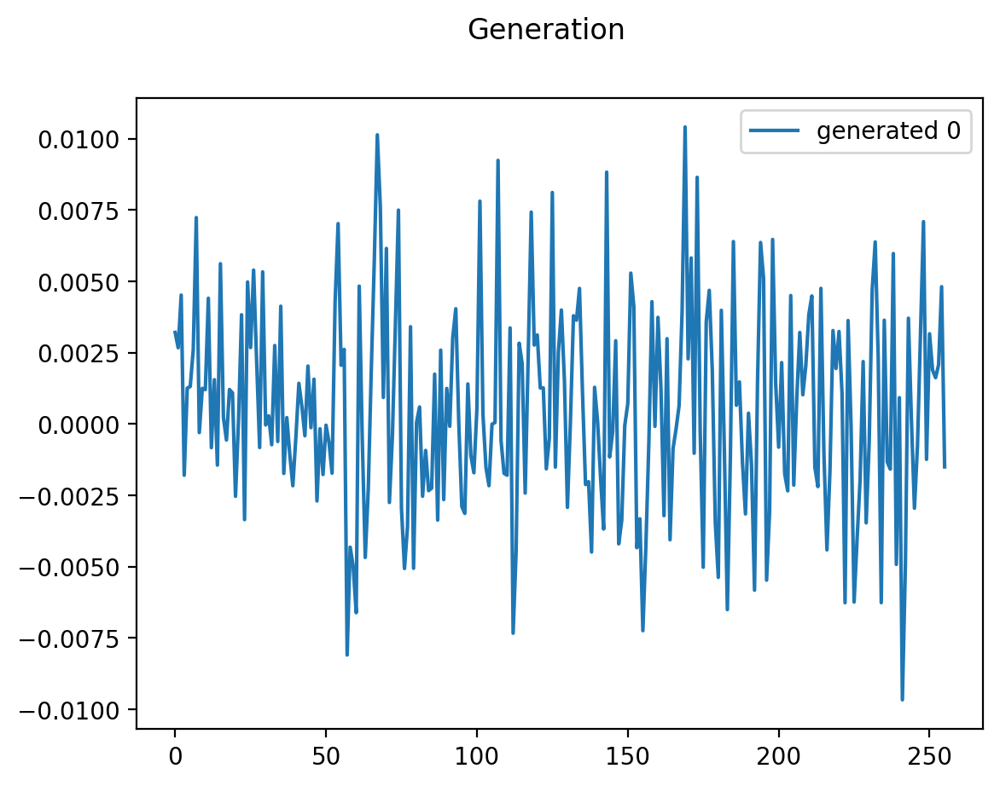

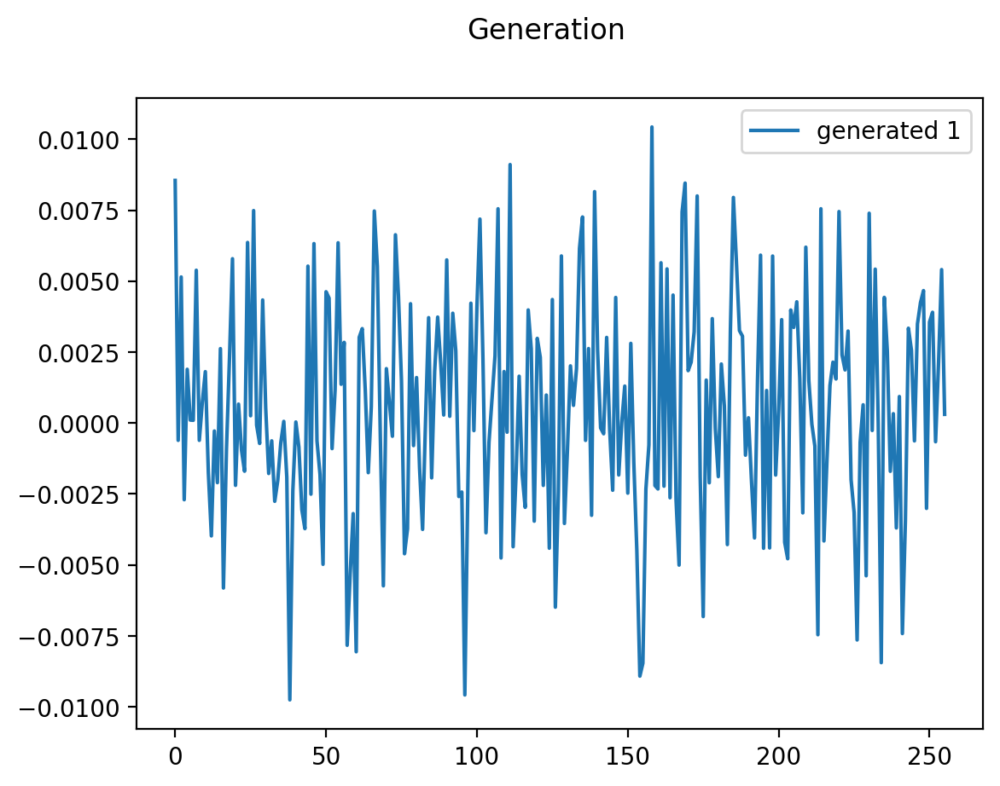

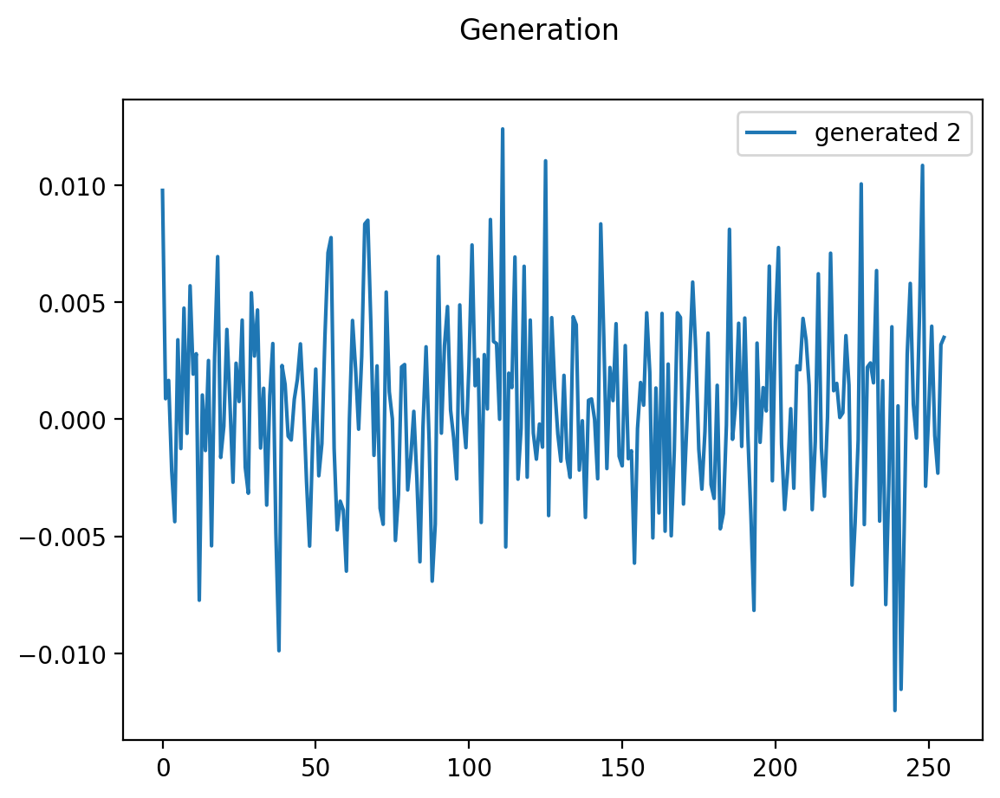

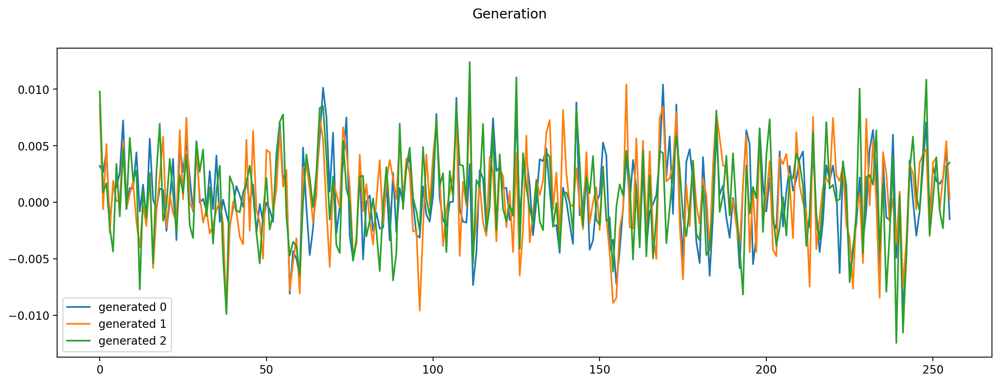

In [447]:
idx = [1, 2, 3]
plot_series(generation, idxs, label = 'generated ', title='Generation', figsize=(15, 5), merge=True)

In [332]:
np.save(gen_dir+'vaefd2.npy',generation)
torch.save(vae1.state_dict(), models_dir +"vaefd2.pth") 

## VAE Fully Convolutional

    # Encoder 
    input
    torch.Size([434, 1, 256])
    conv1
    torch.Size([434, 16, 128])
    conv3
    torch.Size([434, 1, 64])
    flatten
    torch.Size([434, 64])

    # Latent space
    torch.Size([434, 32])
    

    # Decoder
    decoder input
    torch.Size([434, 64])
    unflatten
    torch.Size([434, 1, 64])
    deconv1
    torch.Size([434, 16, 128])
    deconv3
    torch.Size([434, 1, 256])
    deconv4
    torch.Size([434, 1, 256])
    flatten
    torch.Size([434, 256])
    linear
    torch.Size([434, 256])
 

In [344]:
class VAE_Conv(VAE_Base):
    def __init__(self,  h_dim=64, **kwargs):
        super(VAE_Conv, self).__init__( **kwargs)
        self.h_dim = h_dim
        self.encoder = nn.Sequential(
            # PrintLayer('input'),
            nn.Conv1d(1, 16, kernel_size=3, stride=2, padding=1).double(),
            # PrintLayer('conv1'),    
            nn.ReLU().double(),
            nn.Conv1d(16, 1, kernel_size=3, stride=2, padding=1).double(),
            # PrintLayer('conv3'),
            nn.ReLU().double(),
            nn.Flatten().double(),  # squezze 1 dimention (filter)
            # PrintLayer('flatten'),      
        )
        
        
        self.fc1 = nn.Linear(self.h_dim, self.latent_dims).double()
        self.fc2 = nn.Linear(self.h_dim, self.latent_dims).double()
        self.fc3 = nn.Linear(self.latent_dims, self.h_dim).double()
        
        self.decoder = nn.Sequential(
            # PrintLayer('decoder input'),
            UnFlatten(), # add 1 dimention (filter)
            # PrintLayer('unflatten'),
            nn.ConvTranspose1d(1, 16, kernel_size=3, stride=2, padding=1 ,output_padding=1).double(),
            # PrintLayer('deconv1'),
            nn.ReLU().double(),
            nn.ConvTranspose1d(16, 1, kernel_size=3, stride=2, padding=1, output_padding=1).double(),
            # PrintLayer('deconv3'),
            nn.ReLU().double(),
            # PrintLayer('deconv4'),
        )

        self.last_layer = nn.Sequential(
            nn.Flatten().double(),
            # PrintLayer('flatten'),
            nn.Linear(256, 256).double(),
            # PrintLayer('linear'),
            UnFlatten3(),
            # PrintLayer('unflatten'),
        )
        
    def decode(self, z):
        # print('decoder input', z.shape)
        z = self.fc3(z)
        # print('decoder input', z.shape)
        z = self.decoder(z)
        z = self.last_layer(z)
        return z

class UnFlatten3(nn.Module):
    def forward(self, input, last_dim=256):
        return input.view(input.size(0), 1, last_dim)

In [349]:
latent_dims = 32
vae_conv = VAE_Conv(latent_dims=latent_dims).to(device)

Epoch 1/40, Loss=1013.4654720659129, Recon=351.7324874172108, Reg=6969.062333904228 
Epoch 2/40, Loss=913.1277482960589, Recon=256.5824293743214, Reg=6822.035618591694 
Epoch 3/40, Loss=845.5657018980795, Recon=195.96816755167166, Reg=6691.943511015747 
Epoch 4/40, Loss=797.5033859046792, Recon=155.55829921709514, Reg=6575.009166092937 
Epoch 5/40, Loss=761.7388453063029, Recon=127.72149534412944, Reg=6467.894994965862 
Epoch 6/40, Loss=733.7344829700198, Recon=107.71999131697719, Reg=6367.864907847403 
Epoch 7/40, Loss=711.3348453240238, Recon=93.41937457007222, Reg=6272.57408210959 
Epoch 8/40, Loss=692.549438036646, Recon=82.80819218766003, Reg=6180.220650677523 
Epoch 9/40, Loss=676.281247278237, Recon=74.78495061100418, Reg=6089.74791728333 
Epoch 10/40, Loss=662.0488685411792, Recon=68.86043858254305, Reg=6000.744738168905 
Epoch 11/40, Loss=649.008552795659, Recon=64.08304614974037, Reg=5913.338112608927 
Epoch 12/40, Loss=637.0218819694945, Recon=60.25001697214325, Reg=5827.968

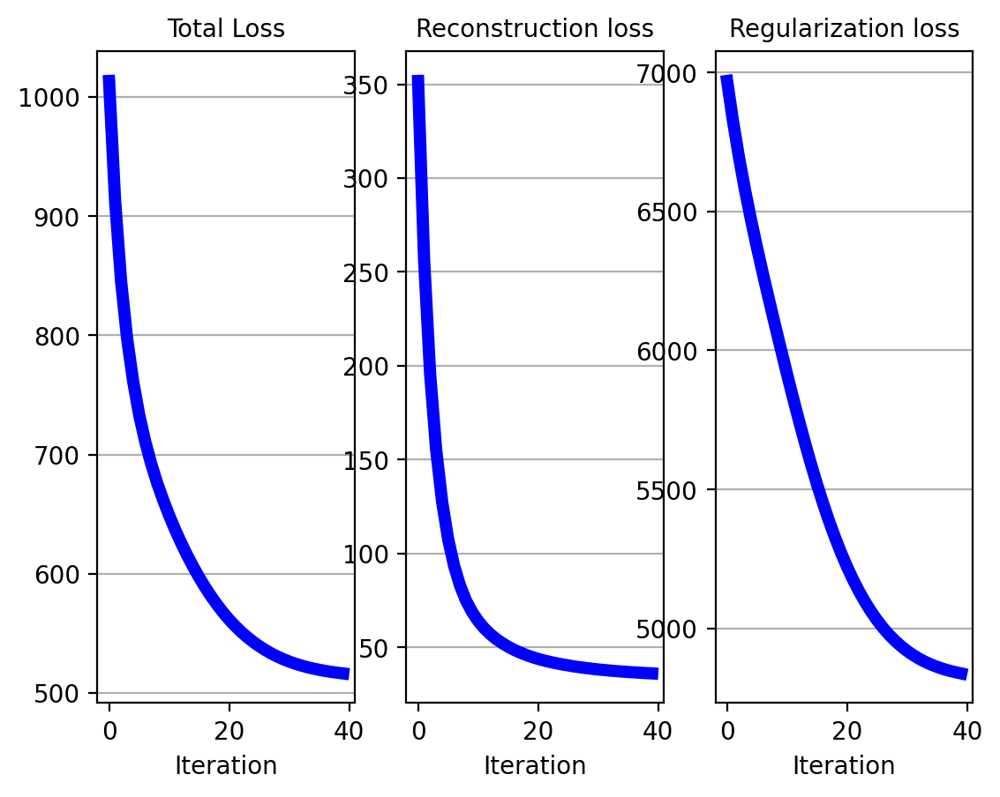

In [350]:
vae_conv = train_vae(vae_conv, data.copy(), 40,extra_dim=True, learning_rate=0.00001, lambda_rec=0.9, lambda_reg=0.10)

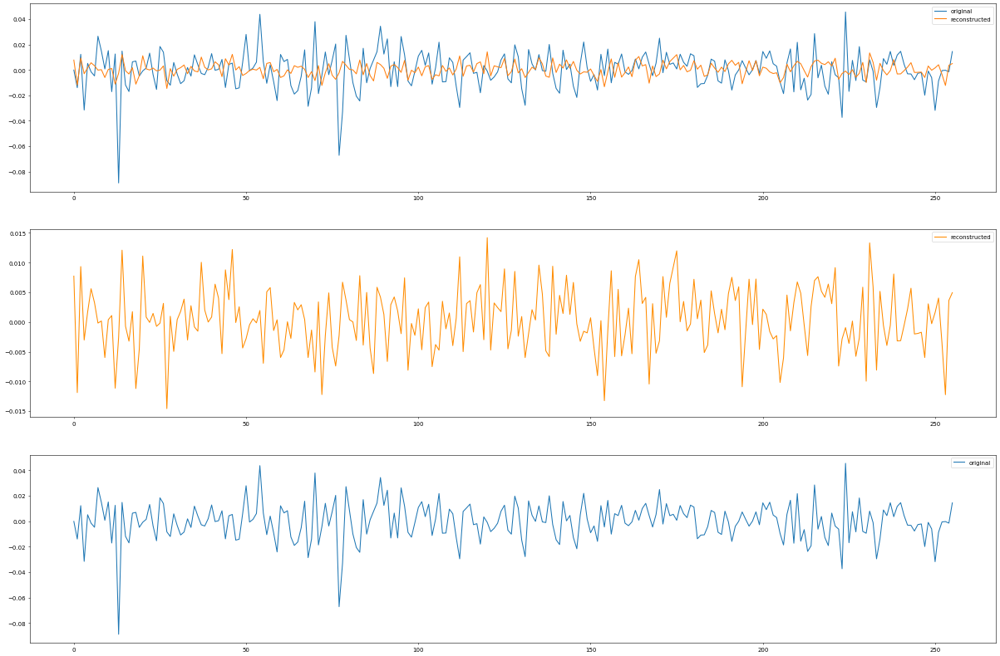

In [395]:
batch_idx = 0
series_idx = 2
_=plot_reconstruction(batch_idx, series_idx, vae_conv, data, extra_dim=True)

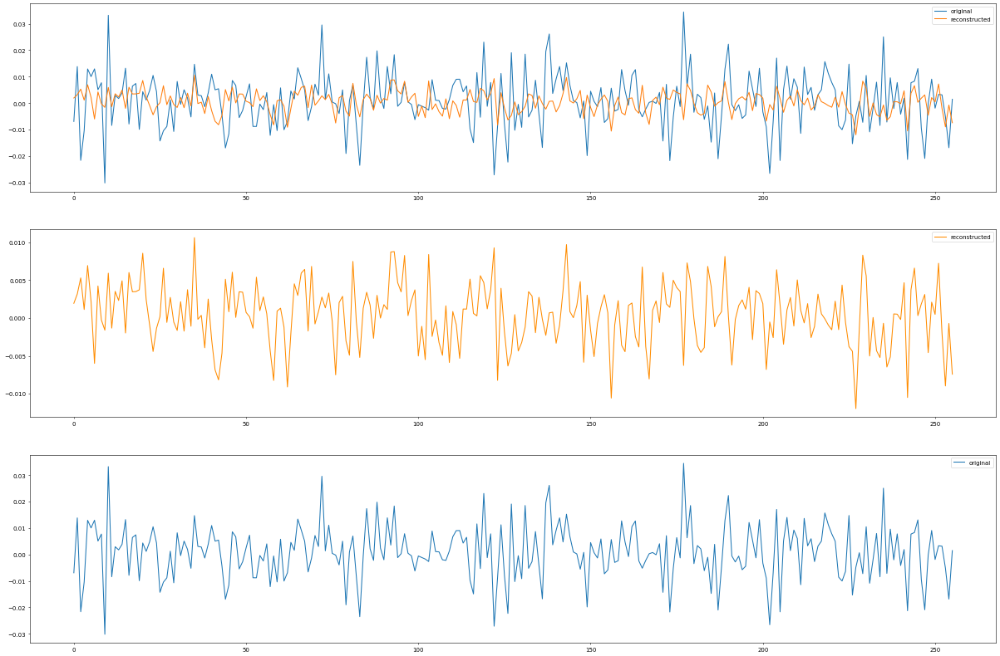

In [396]:
batch_idx = 40
series_idx = 2
x_hat = plot_reconstruction(batch_idx, series_idx, vae_conv, data, extra_dim=True)

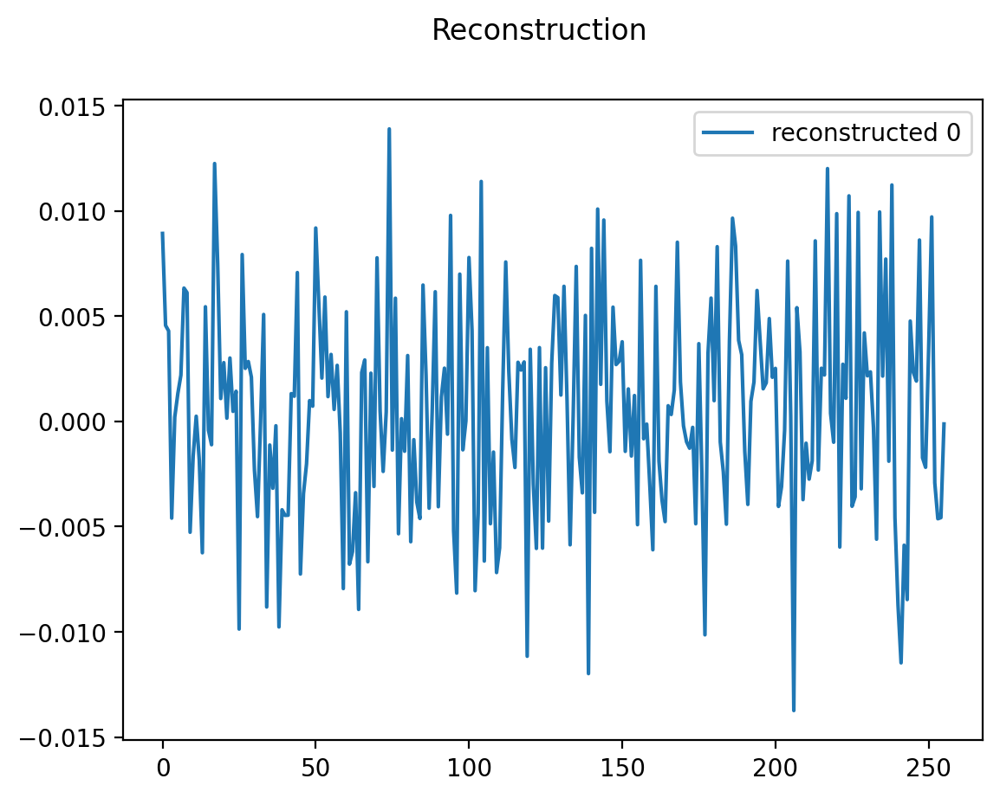

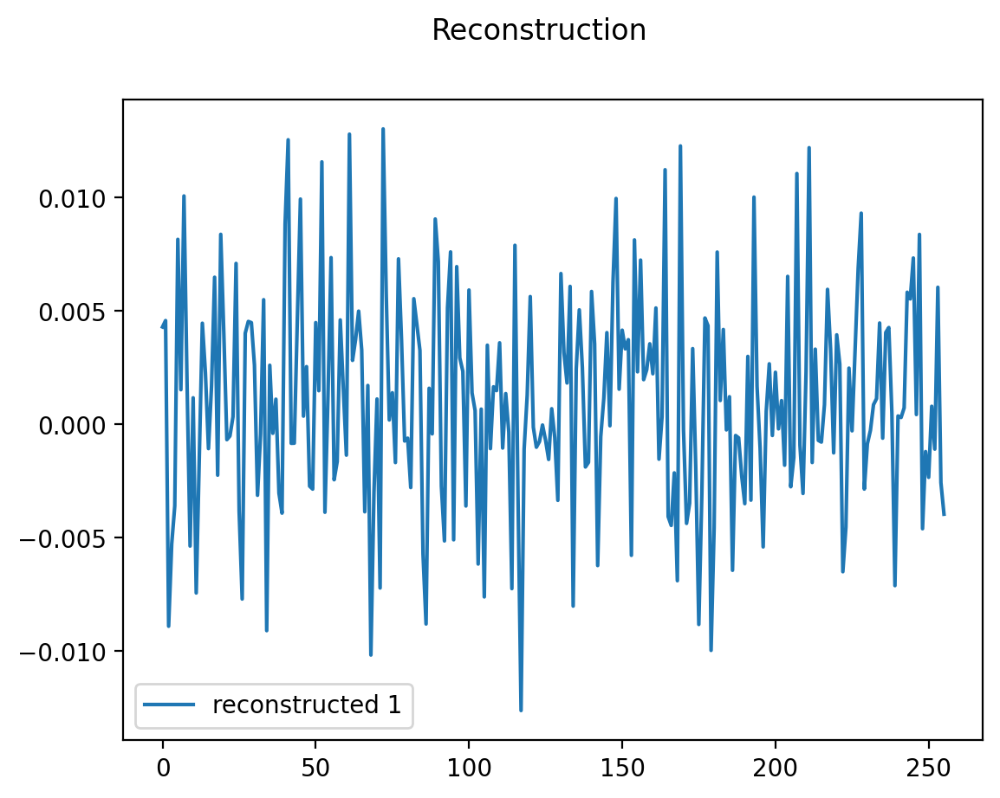

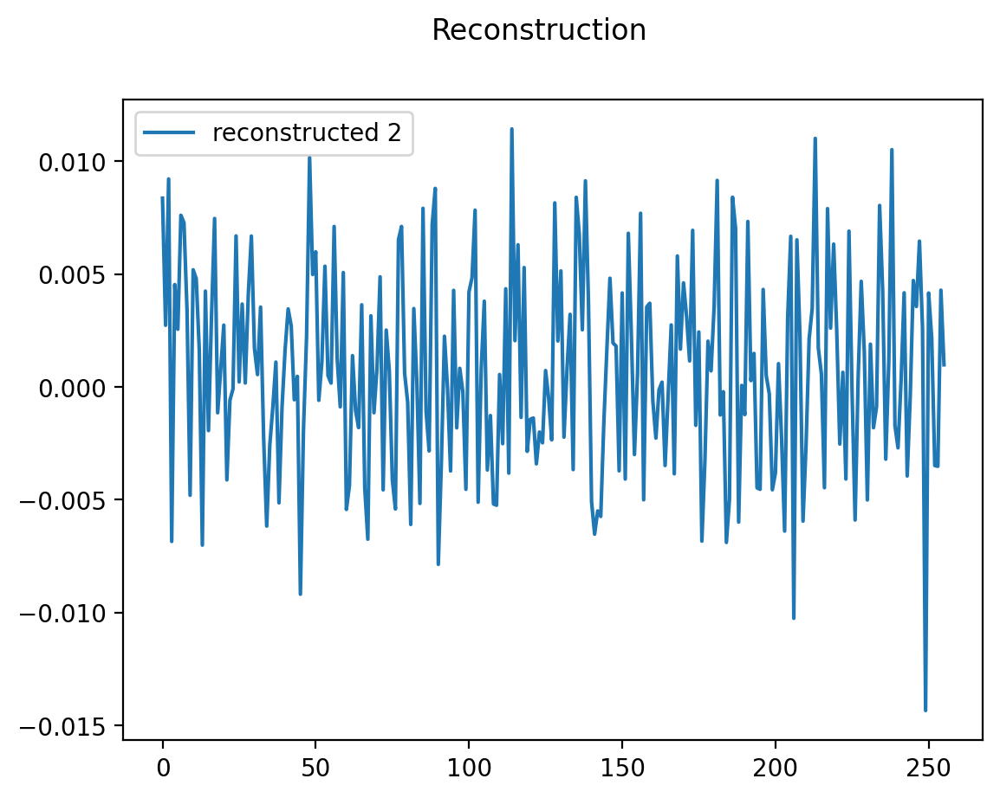

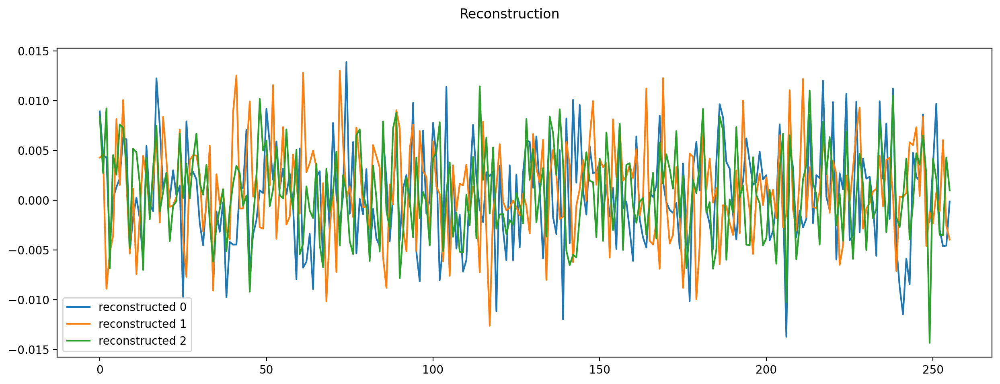

In [382]:
idxs = [20,50,110]
plot_series(x_hat, idxs, label = 'reconstructed ', title='Reconstruction', figsize=(15, 5), merge=True)

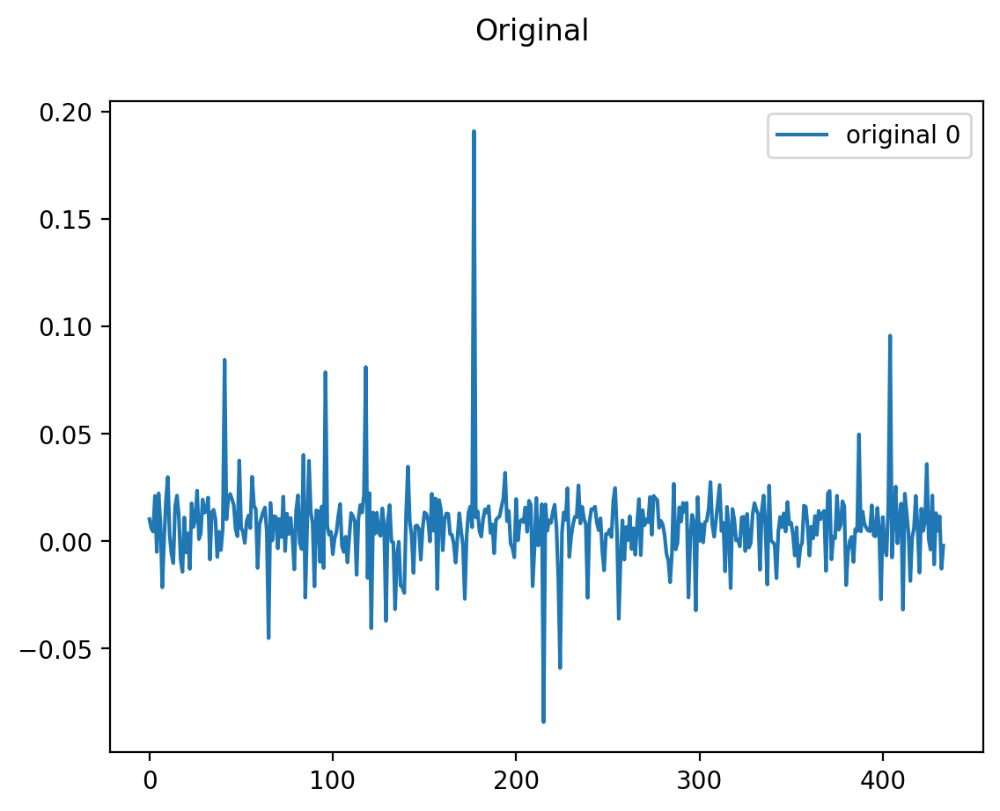

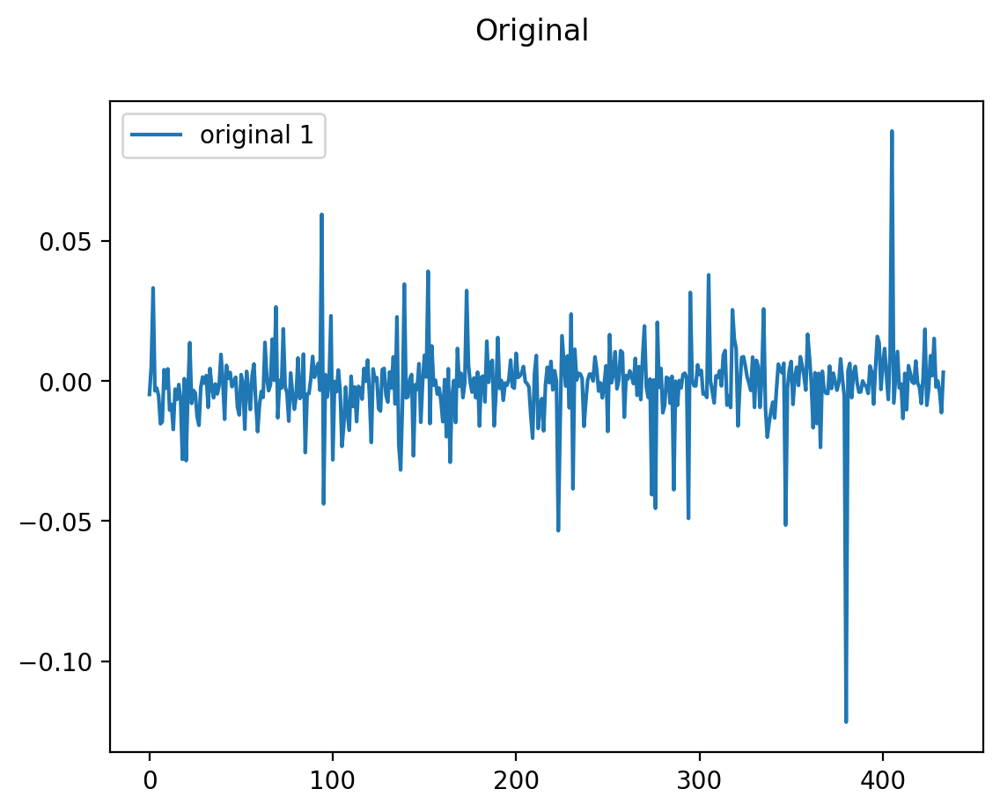

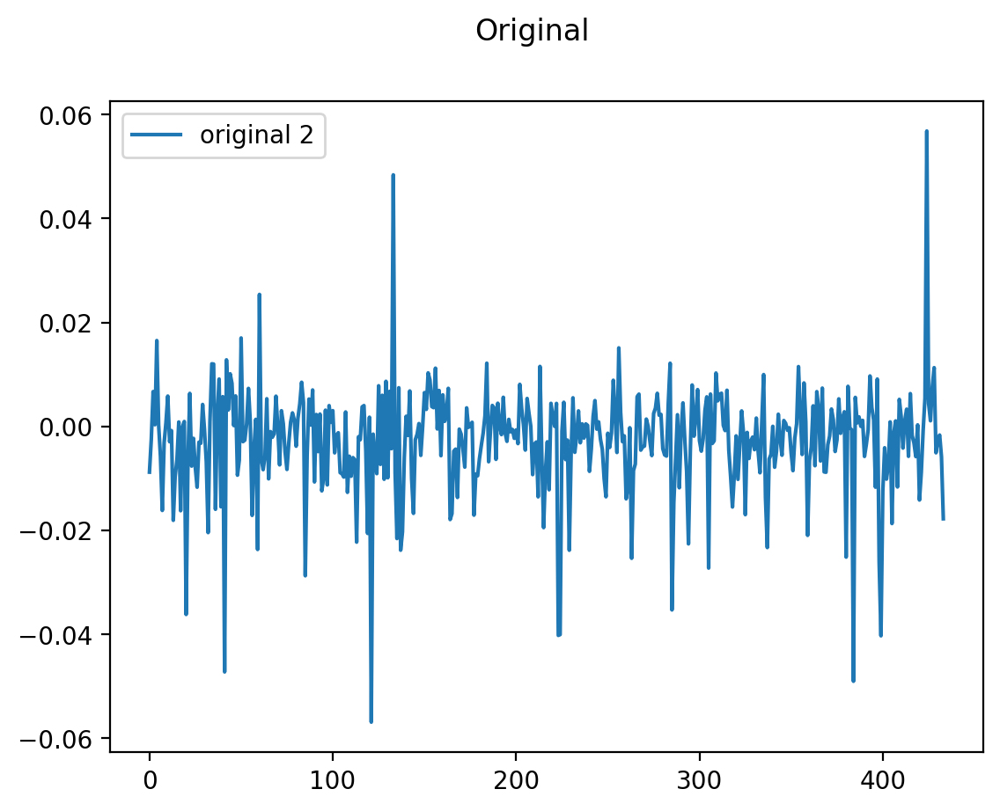

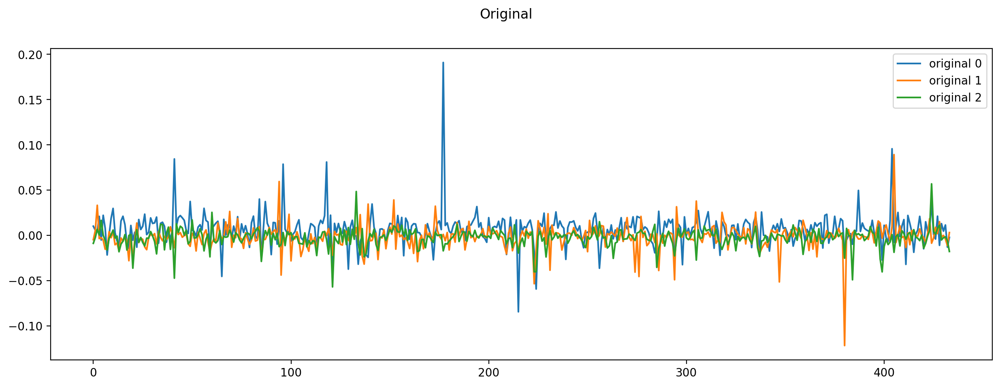

In [354]:
idxs = [20,10,110]
plot_series(data[batch_idx], idxs, label = 'original ', title='Original', figsize=(15, 5), merge=True)

In [448]:
latent_dims = 32
generation = vae_generation(vae_conv.decode, latent_dims= [stocks, latent_dims], extra_dim=True)
generation.shape

(434, 256)

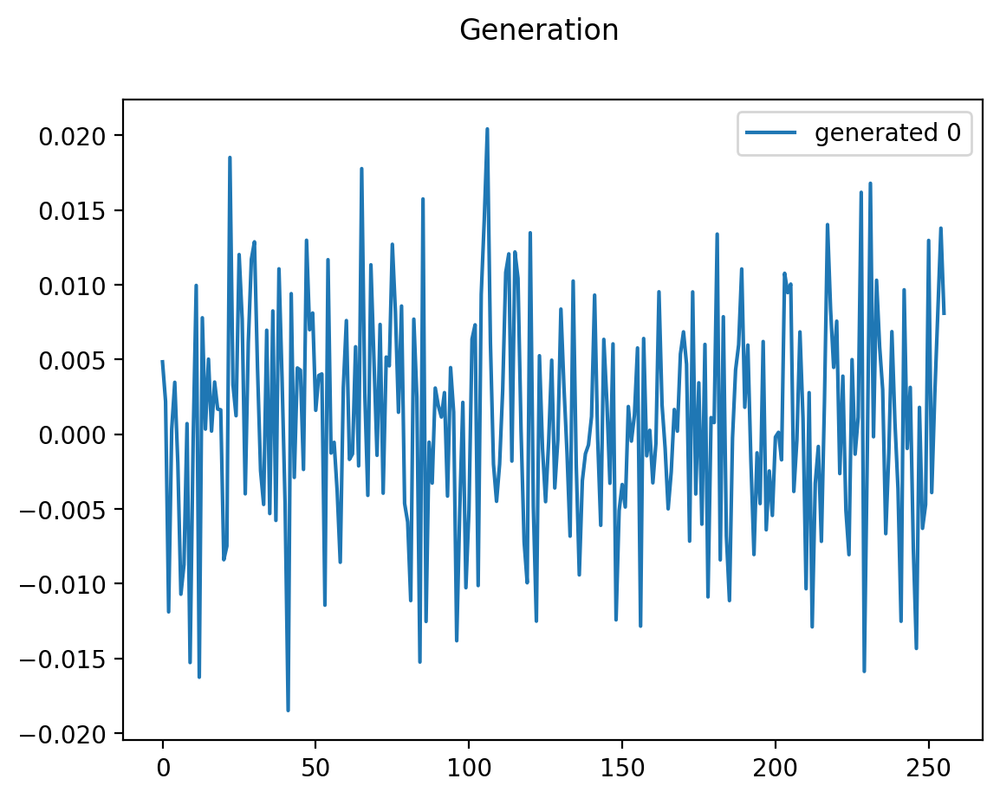

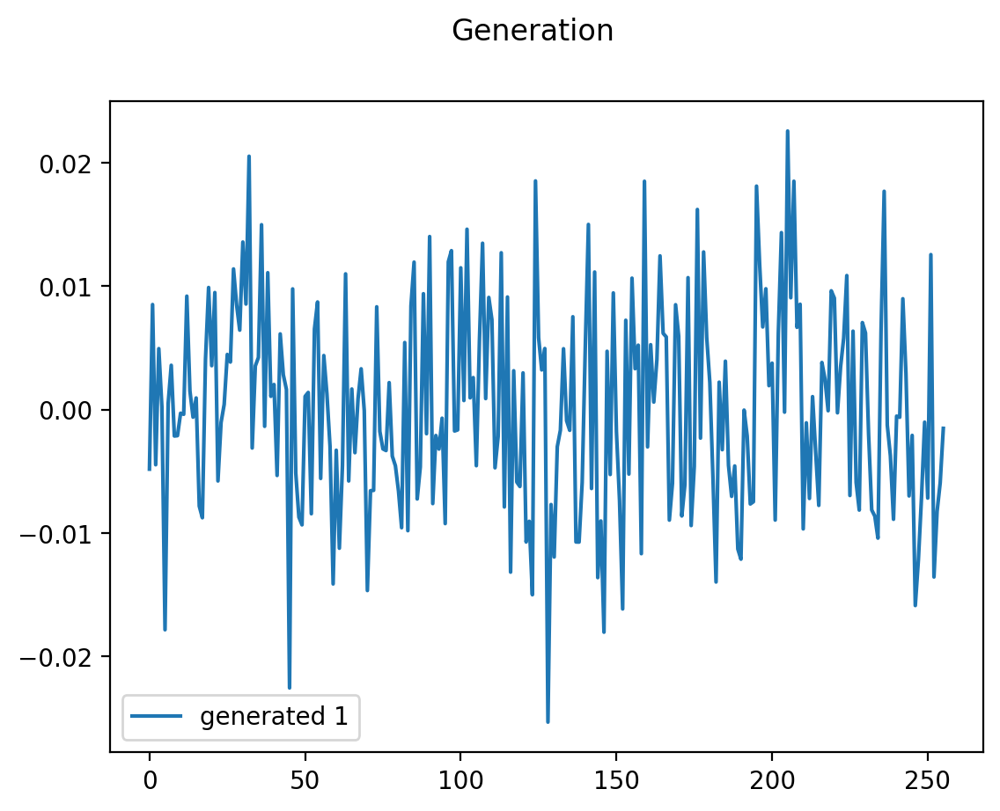

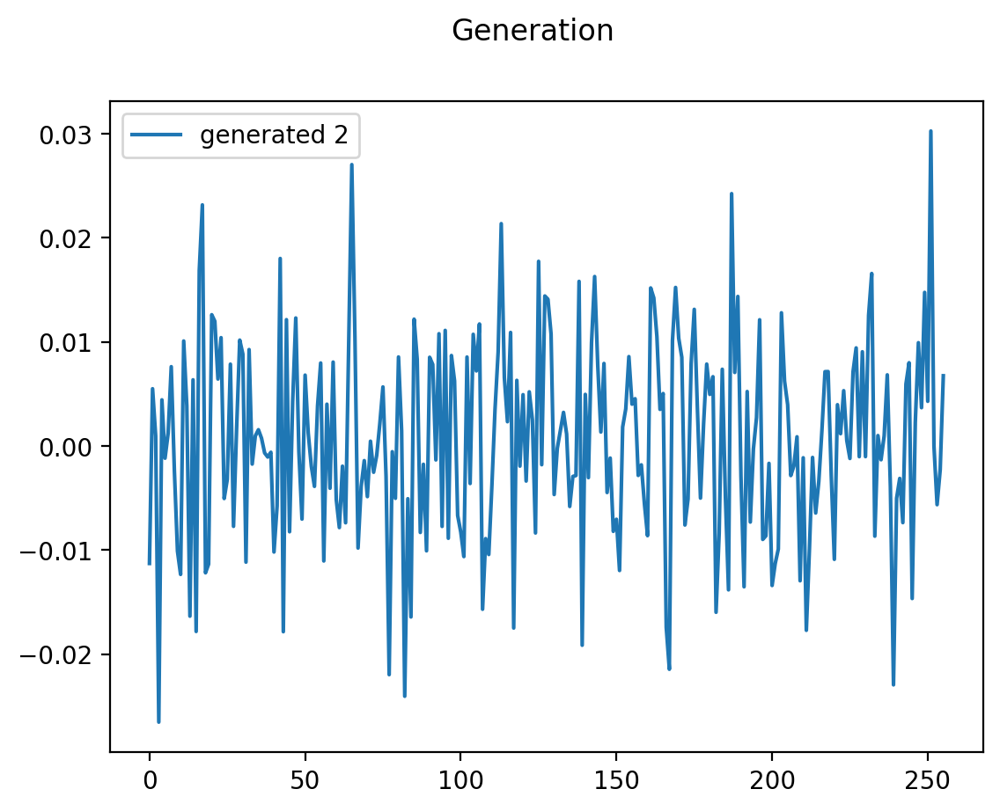

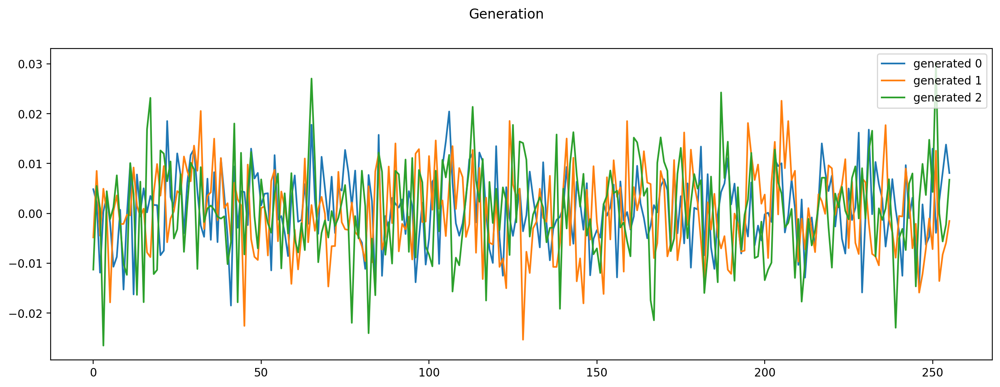

In [449]:
idx = [1, 2, 3]
plot_series(generation, idxs, label = 'generated ', title='Generation', figsize=(15, 5), merge=True)


In [356]:
np.save(gen_dir+'vaeconv1.npy', generation)
torch.save(vae_conv.state_dict(), models_dir +"vaeconv1.pth") 

## VAE Fully Convolutional paper

    # Enconder
    input
    torch.Size([434, 1, 256])
    conv1
    torch.Size([434, 1, 128])
    conv2
    torch.Size([434, 12, 64])
    conv3
    torch.Size([434, 24, 32])
    conv4
    torch.Size([434, 48, 16])
    conv5
    torch.Size([434, 96, 8])
    conv6
    torch.Size([434, 1, 4])
    
    # laten
    flatten
    torch.Size([434, 4])
    decoder input torch.Size([434, 100])
    decoder input torch.Size([434, 4])
    
    # Decoder
    decoder input
    torch.Size([434, 4])
    unflatten
    torch.Size([434, 1, 4])
    deconv1
    torch.Size([434, 96, 8])
    deconv2
    torch.Size([434, 48, 16])
    deconv3
    torch.Size([434, 24, 32])
    deconv4
    torch.Size([434, 12, 64])
    deconv5
    torch.Size([434, 1, 128])
    deconv6
    torch.Size([434, 1, 256])

In [409]:
class VAE_Conv2(VAE_Base):
    def __init__(self,  h_dim=64, **kwargs):
        super(VAE_Conv2, self).__init__( **kwargs)
        self.h_dim = h_dim
        self.encoder = nn.Sequential(
            # PrintLayer('input'),
            nn.Conv1d(1, 1, kernel_size=4, stride=2, padding=1).double(),
            # PrintLayer('conv1'),
            nn.ReLU().double(),
            nn.Conv1d(1, 12, kernel_size=4, stride=2, padding=1).double(),
            # PrintLayer('conv2'),
            nn.ReLU().double(),
            nn.Conv1d(12, 24, kernel_size=4, stride=2, padding=1).double(),
            # PrintLayer('conv3'),
            nn.ReLU().double(),
            nn.Conv1d(24, 48, kernel_size=4, stride=2, padding=1).double(),
            # PrintLayer('conv4'),
            nn.ReLU().double(),
            nn.Conv1d(48, 96, kernel_size=4, stride=2, padding=1).double(),
            # PrintLayer('conv5'),
            nn.ReLU().double(),
            nn.Conv1d(96, 1, kernel_size=3, stride=2, padding=1).double(),
            # PrintLayer('conv6'),
            nn.Flatten().double(),
            # PrintLayer('flatten'),
        )

        self.fc1 = nn.Linear(self.h_dim, self.latent_dims).double()
        self.fc2 = nn.Linear(self.h_dim, self.latent_dims).double()
        self.fc3 = nn.Linear(self.latent_dims, self.h_dim).double()

        self.decoder = nn.Sequential(

            # PrintLayer('decoder input'),
            UnFlatten(),
            # PrintLayer('unflatten'),
            nn.ConvTranspose1d(1, 96, kernel_size=4, stride=2, padding=1 ,output_padding=0).double(),
            # PrintLayer('deconv1'),
            nn.ReLU().double(),
            nn.ConvTranspose1d(96, 48, kernel_size=4, stride=2, padding=1, output_padding=0).double(),
            # PrintLayer('deconv2'),
            nn.ReLU().double(),
            nn.ConvTranspose1d(48, 24, kernel_size=4, stride=2, padding=1, output_padding=0).double(),
            # PrintLayer('deconv3'),
            nn.ReLU().double(),
            nn.ConvTranspose1d(24, 12, kernel_size=4, stride=2, padding=1, output_padding=0).double(),
            # PrintLayer('deconv4'),
            nn.ReLU().double(),
            nn.ConvTranspose1d(12, 1, kernel_size=4, stride=2, padding=1, output_padding=0).double(),
            # PrintLayer('deconv5'),
            nn.ReLU().double(),
            nn.ConvTranspose1d(1, 1, kernel_size=4, stride=2, padding=1, output_padding=0).double(),
            # PrintLayer('deconv6'),
            nn.ReLU().double(),


        )
        self.last_layer = nn.Sequential(
            nn.Flatten().double(),
            # PrintLayer('flatten'),
            nn.Linear(256, 256).double(),
            nn.Tanh().double(),
            # PrintLayer('linear'),
            UnFlatten3(),
            # PrintLayer('unflatten'),
        )

    def decode(self, z):
        # print('decoder input', z.shape)
        z = self.fc3(z)
        # print('decoder input', z.shape)
        z = self.decoder(z)
        # z = self.last_layer(z)
        return z
    
class UnFlatten2(nn.Module):
    def forward(self, input, last_dim=96):
        return input.view(input.size(0), last_dim, 8)
class UnFlatten3(nn.Module):
    def forward(self, input, last_dim=256):
        return input.view(input.size(0), 1, last_dim)

In [410]:
latent_dims = 100
vae_conv2 = VAE_Conv2(latent_dims=latent_dims, h_dim=4).to(device)

Epoch 1/20, Loss=22232.036520999693, Recon=13241.644491304982, Reg=31222.428550694425 
Epoch 2/20, Loss=19243.373858541934, Recon=10983.740425502112, Reg=27503.007291581765 
Epoch 3/20, Loss=16137.54047458331, Recon=8764.249760071087, Reg=23510.83118909553 
Epoch 4/20, Loss=13370.182961079901, Recon=6575.533176817794, Reg=20164.83274534202 
Epoch 5/20, Loss=11434.971048943848, Recon=4972.601086949313, Reg=17897.34101093839 
Epoch 6/20, Loss=10169.581428819549, Recon=3769.946346015376, Reg=16569.216511623727 
Epoch 7/20, Loss=9343.77761891439, Recon=2824.764584874848, Reg=15862.79065295394 
Epoch 8/20, Loss=8796.083193135088, Recon=2089.957804316386, Reg=15502.20858195379 
Epoch 9/20, Loss=8421.455444646856, Recon=1529.392604586626, Reg=15313.518284707103 
Epoch 10/20, Loss=8194.59038595969, Recon=1180.3385817405183, Reg=15208.842190178857 
Epoch 11/20, Loss=8053.0943487299655, Recon=958.7956841818956, Reg=15147.393013278037 
Epoch 12/20, Loss=7923.013782198688, Recon=736.2924682502342,

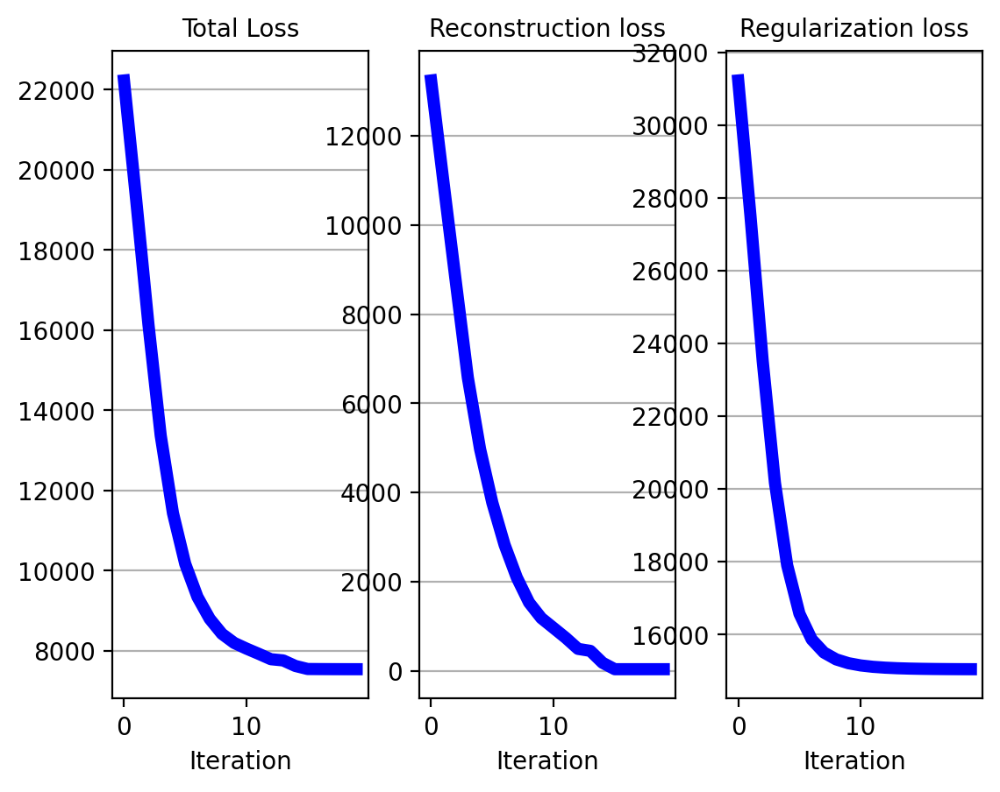

In [411]:
vae_conv2 = train_vae(vae_conv2, data, 20,extra_dim=True, learning_rate=0.0004, lambda_rec=0.5, lambda_reg=0.5)

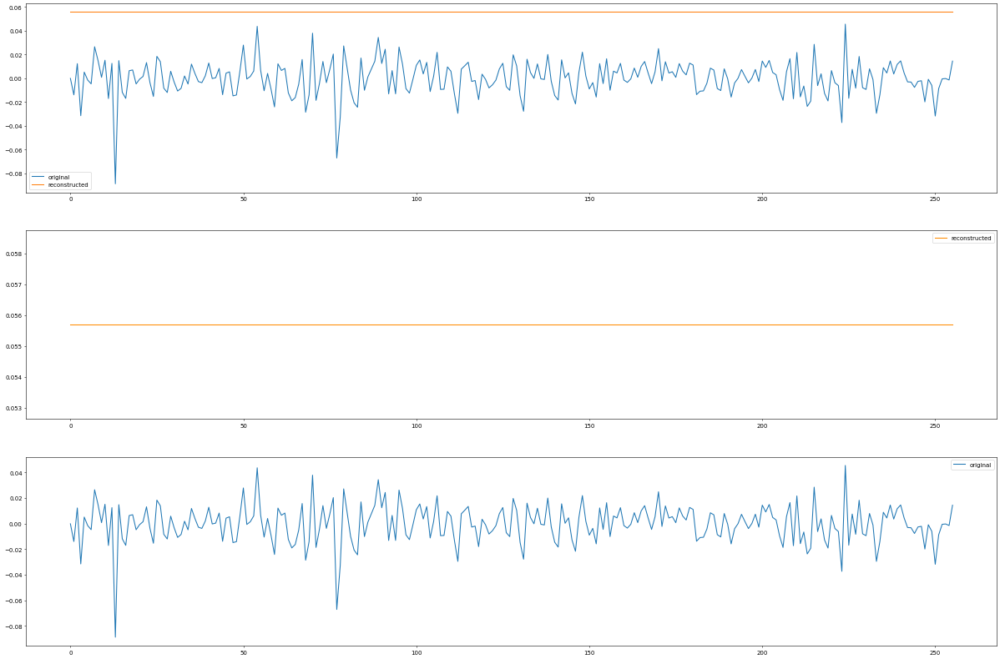

In [397]:
batch_idx = 0
series_idx = 2
x_hat=plot_reconstruction(batch_idx, series_idx, vae_conv2, data.copy(), extra_dim=True)

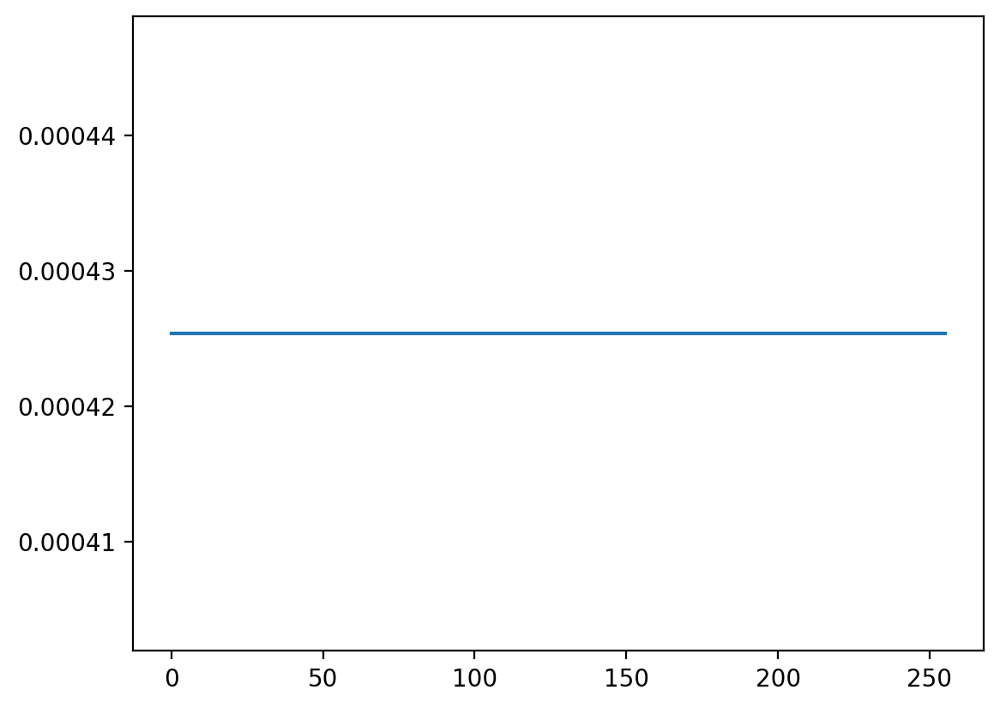

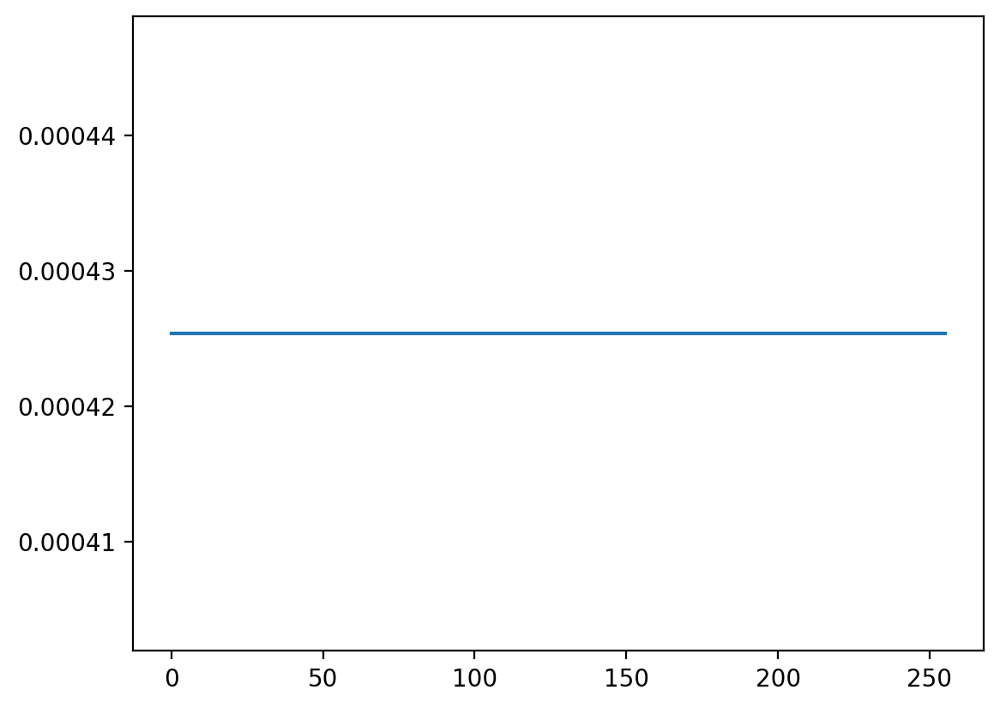

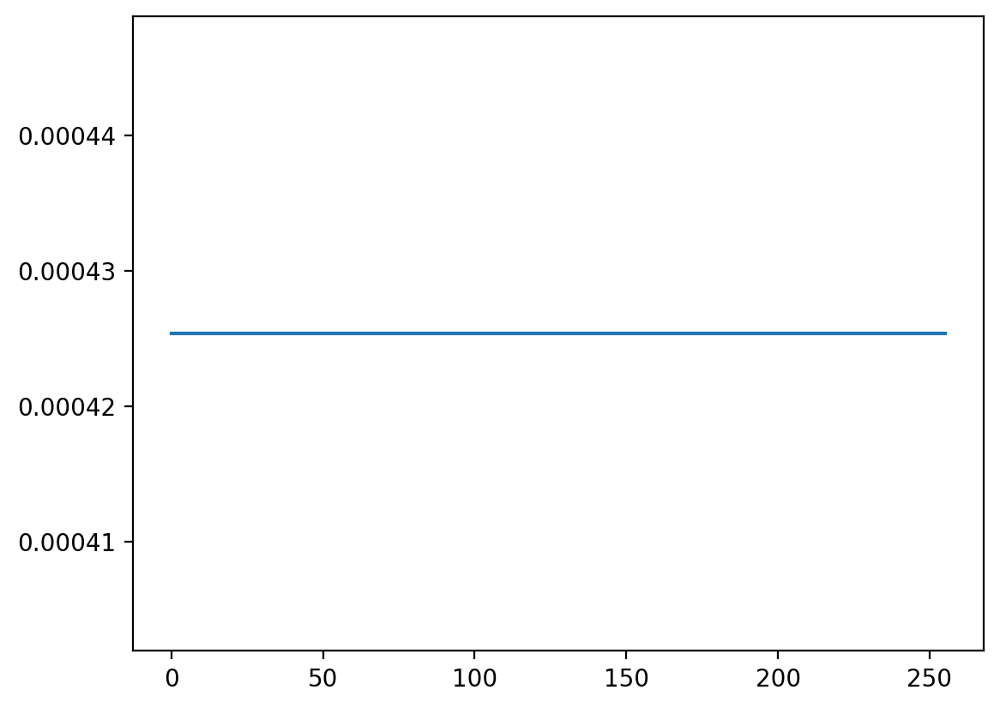

In [228]:
_ = synthesize(vae_conv2.decode,
               n_samples =1, latent_dims= [stocks, 100], extra_dim=True)

# VAE Fully Convolutional 3

    input
    torch.Size([434, 1, 256])
    conv1
    torch.Size([434, 32, 128])
    conv2
    torch.Size([434, 64, 64])
    flatten
    torch.Size([434, 4096])
    decoder input
    torch.Size([434, 4096])
    unflatten
    torch.Size([434, 64, 64])
    deconv2
    torch.Size([434, 32, 128])
    deconv3
    torch.Size([434, 1, 256])
    flatten
    torch.Size([434, 256])
    linear
    torch.Size([434, 256])
    unflatten
    torch.Size([434, 1, 256])

In [398]:
class VAE_Conv3(VAE_Base):
    def __init__(self,  h_dim=64, **kwargs):
        super(VAE_Conv3, self).__init__( **kwargs)
        self.h_dim = h_dim
        self.encoder = nn.Sequential(
            # PrintLayer('input'),
            nn.Conv1d(1, 32, kernel_size=3, stride=2, padding=1).double(),
            # PrintLayer('conv1'),
            nn.ReLU().double(),
            nn.Conv1d(32, 64, kernel_size=3, stride=2, padding=1).double(),
            # PrintLayer('conv2'),
            nn.ReLU().double(),
            nn.Flatten().double(),
            # PrintLayer('flatten'),
        )

        self.fc1 = nn.Linear(self.h_dim, self.latent_dims).double()
        self.fc2 = nn.Linear(self.h_dim, self.latent_dims).double()
        self.fc3 = nn.Linear(self.latent_dims, self.h_dim).double()

        self.decoder = nn.Sequential(

            # PrintLayer('decoder input'),
            UnFlatten2(),
            # PrintLayer('unflatten'),
            # nn.ConvTranspose1d(, 64, kernel_size=64, stride=2, padding=0 ,output_padding=1).double(),
            # PrintLayer('deconv1'),
            # nn.ReLU().double(),
            nn.ConvTranspose1d(64, 32, kernel_size=3, stride=2, padding=1, output_padding=1).double(),
            # PrintLayer('deconv2'),
            nn.ReLU().double(),
            nn.ConvTranspose1d(32,1, kernel_size=3, stride=2, padding=1, output_padding=1).double(),
            # PrintLayer('deconv3'),
            nn.ReLU().double(),
            
        )

        self.last_layer = nn.Sequential(
            nn.Flatten().double(),
            # PrintLayer('flatten'),
            nn.Linear(256, 256).double(),
            # PrintLayer('linear'),
            UnFlatten3(),
            # PrintLayer('unflatten'),
        )
        
    def decode(self, z):
        # print('decoder input', z.shape)
        z = self.fc3(z)
        # print('decoder input', z.shape)
        z = self.decoder(z)
        z = self.last_layer(z)
        return z
    
class UnFlatten2(nn.Module):
    def forward(self, input, last_dim=64):
        return input.view(input.size(0), last_dim, 64)

In [403]:
latent_dims = 100
vae_conv3 = VAE_Conv3(latent_dims=latent_dims, h_dim=4096).to(device)

Epoch 1/20, Loss=7198.080615085609, Recon=3219.055388596832, Reg=16482.472810226092 
Epoch 2/20, Loss=5352.211402998844, Recon=1141.7639881678945, Reg=15176.588704271067 
Epoch 3/20, Loss=5083.736917868121, Recon=791.3774708978582, Reg=15099.242294132064 
Epoch 4/20, Loss=4950.8730943354485, Recon=612.6427970247275, Reg=15073.410454727144 
Epoch 5/20, Loss=4866.831060694881, Recon=497.77790385411845, Reg=15061.288426656665 
Epoch 6/20, Loss=4805.744495276154, Recon=413.53066611987236, Reg=15054.24342997414 
Epoch 7/20, Loss=4757.744390719077, Recon=346.81502523347905, Reg=15049.912910185478 
Epoch 8/20, Loss=4719.692378177453, Recon=293.63661342326435, Reg=15047.155829270565 
Epoch 9/20, Loss=4687.783842719172, Recon=248.85567215400837, Reg=15045.282907371218 
Epoch 10/20, Loss=4660.095504837754, Recon=209.82201174418418, Reg=15044.06698872275 
Epoch 11/20, Loss=4636.652204249231, Recon=176.680594813288, Reg=15043.252626266436 
Epoch 12/20, Loss=4618.669426748411, Recon=151.19646257845

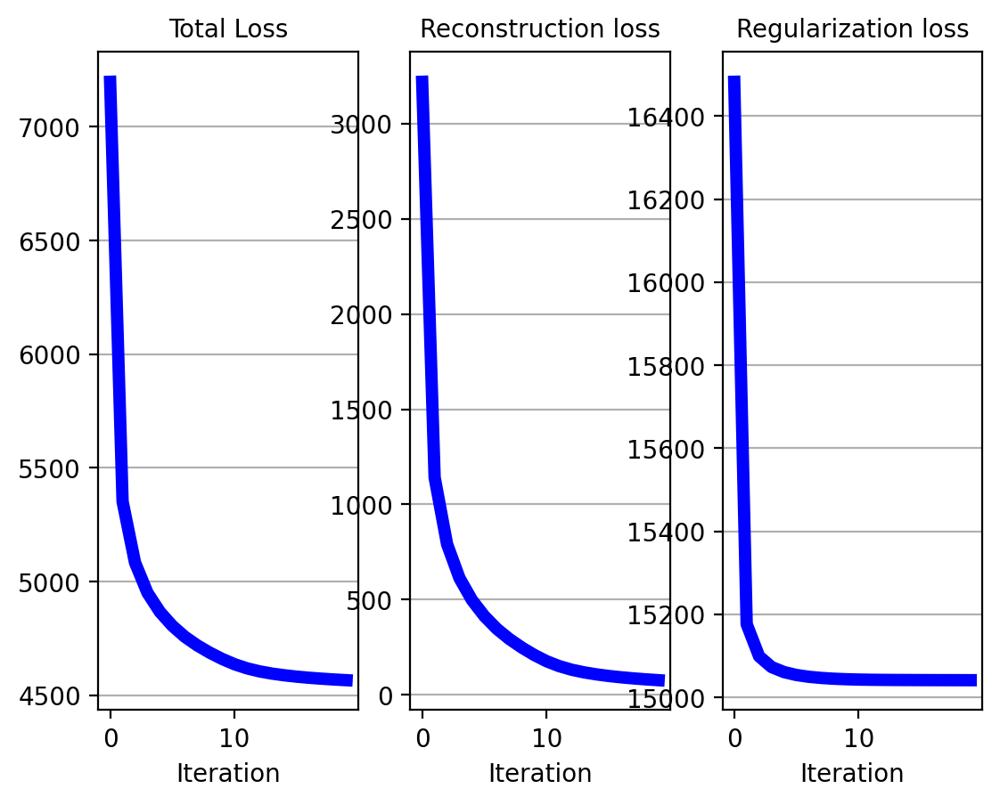

In [404]:
vae_conv3 = train_vae(vae_conv3, data, 20,extra_dim=True, learning_rate=0.0001, lambda_rec=0.7, lambda_reg=0.3)

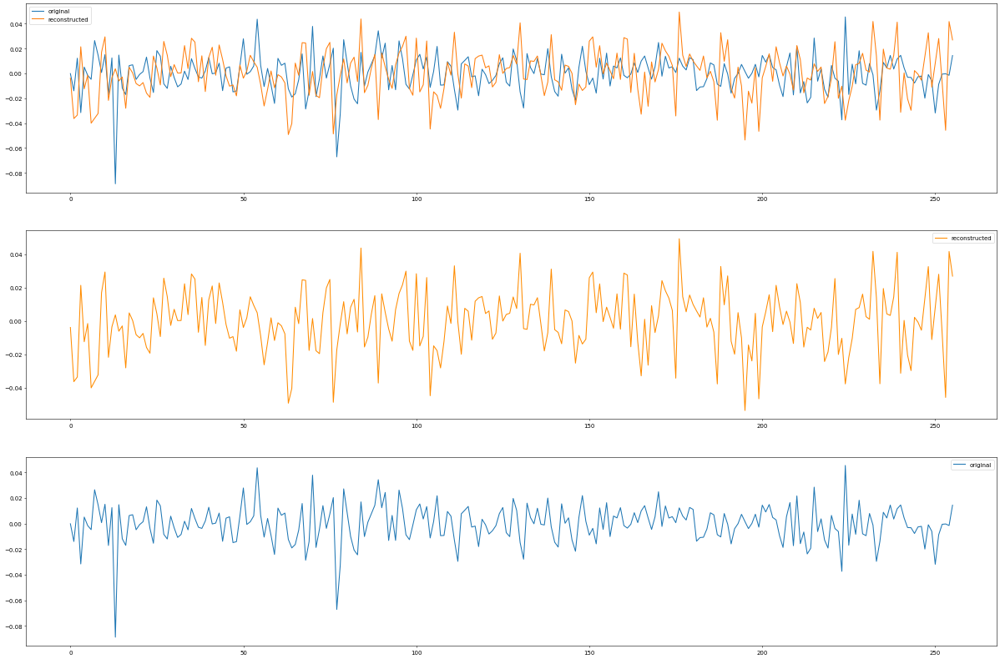

In [405]:
batch_idx = 0
series_idx = 2
x_hat=plot_reconstruction(batch_idx, series_idx, vae_conv3, data.copy(), extra_dim=True)

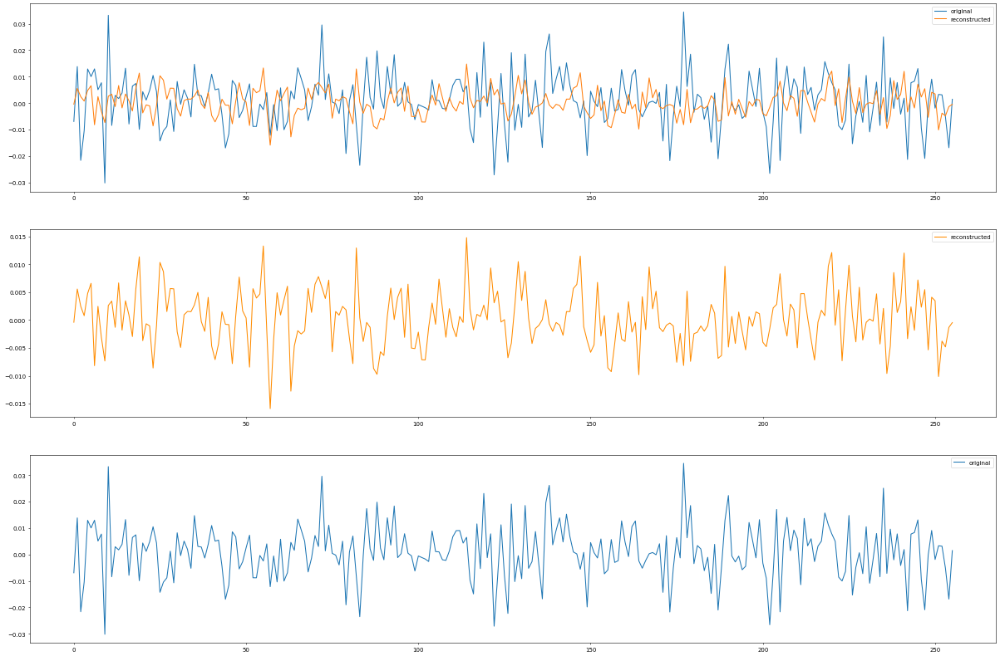

In [406]:
batch_idx = 40
series_idx = 2
x_hat = plot_reconstruction(batch_idx, series_idx, vae_conv, data.copy(), extra_dim=True)

In [450]:
generation = vae_generation(vae_conv3.decode,latent_dims= [stocks, 100], extra_dim=True) 
generation.shape

(434, 256)

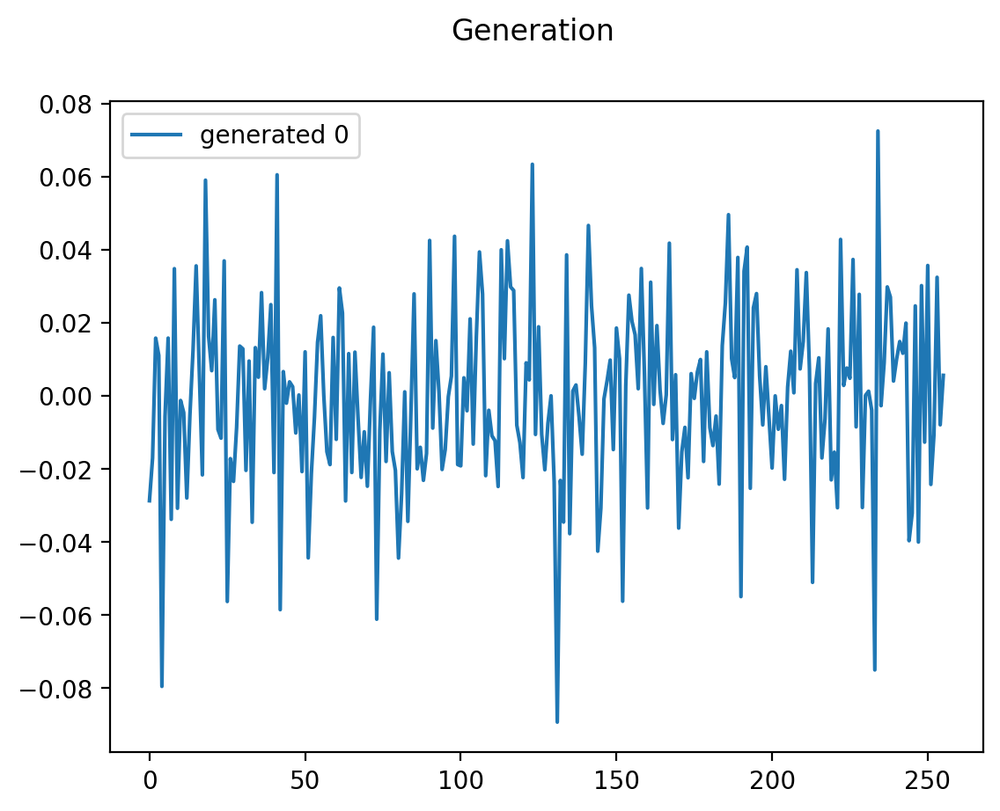

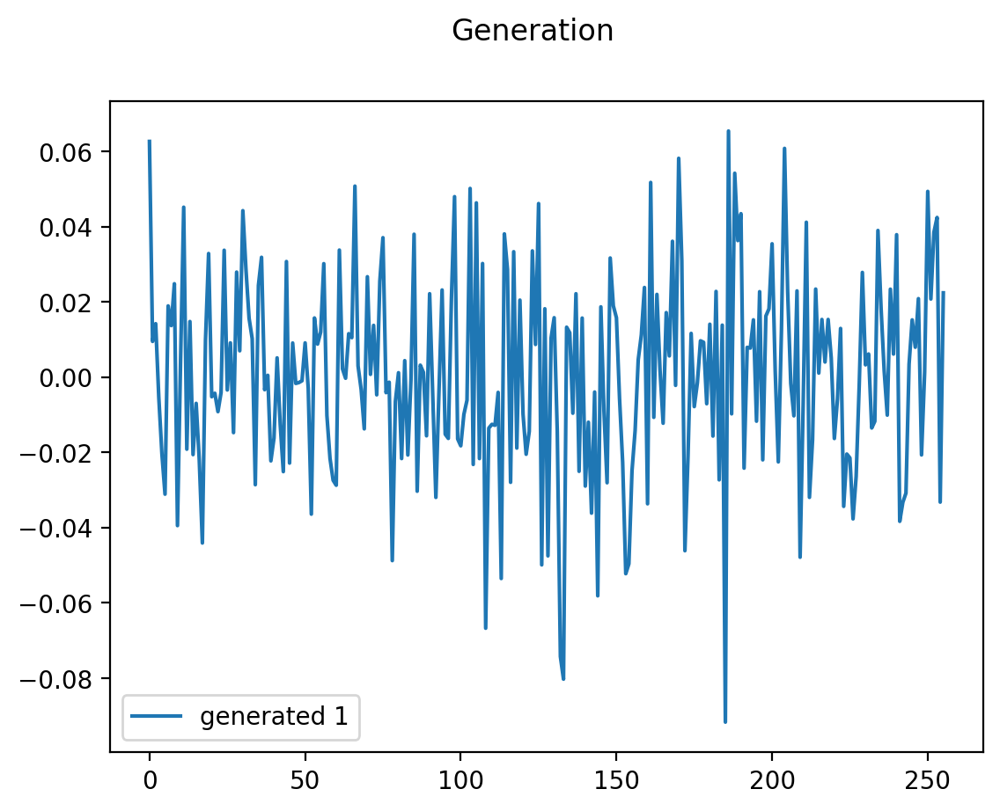

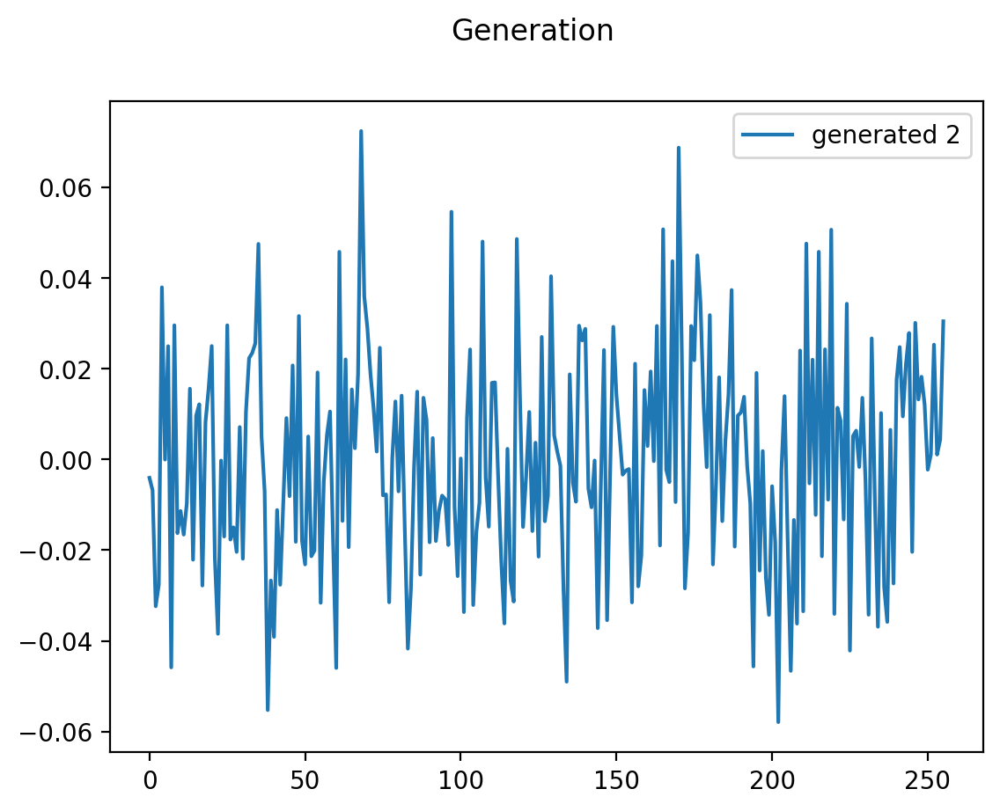

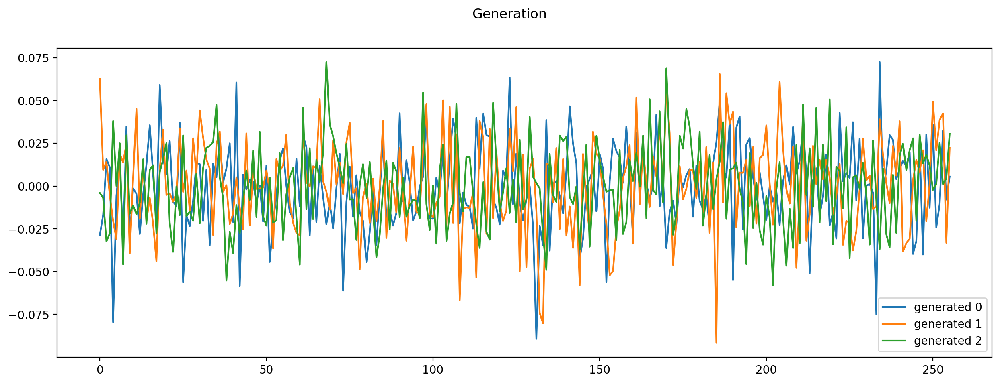

In [451]:
idx = [1, 2, 3]
plot_series(generation, idxs, label = 'generated ', title='Generation', figsize=(15, 5), merge=True)

In [408]:
np.save(gen_dir+'vaeconv3.npy',generation)
torch.save(vae_conv3.state_dict(), models_dir +"vaeconv3.pth") 